## First attempt at combining the alm, wigner rotations and visibility response

In [1]:
import os
import numpy as np
import pylab as plt

import healpy as hp
import pyuvsim
from pyuvdata import UVBeam

# Hydra
import sys
sys.path.append("/home/phil/hera/Hydra") # change this to your own path
import hydra

# Linear solver 
from scipy.sparse.linalg import cg, LinearOperator

# All things astropy
from astropy import units
from astropy.coordinates import EarthLocation, SkyCoord
from astropy.coordinates.builtin_frames import AltAz, ICRS
from astropy.time import Time

import time

In [94]:
%load_ext memory_profiler

## Solving the linear system $A x = b$

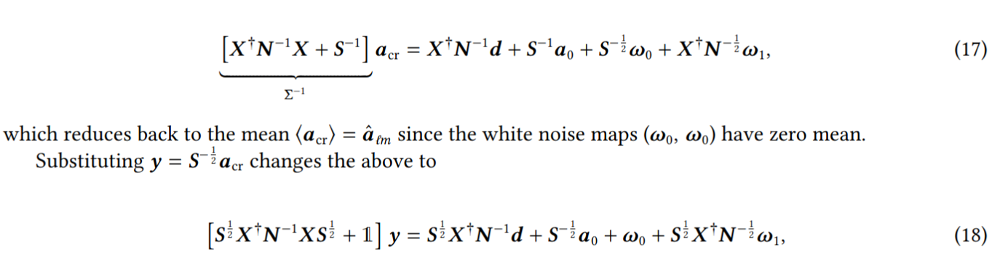

In [2]:
def vis_proj_operator_lsts(freqs, lsts, beams, ant_pos, lmax, nside, latitude=-0.5361913261514378):
    """
    Visibility projection operator, constructed from each a_lm.
    """
    # Get 
    ell, m, vis_alm = hydra.vis_simulator.simulate_vis_per_alm(lmax=lmax, 
                                                               nside=nside, 
                                                               ants=ant_pos, 
                                                               freqs=freqs, 
                                                               lsts=lsts, 
                                                               beams=beams,
                                                               latitude=latitude)
    # Construct list of antenna pairs
    ants = list(ant_pos.keys())
    antpairs = []
    for i in ants:
        for j in ants:
            if j >= i:
                antpairs.append((ants[i],ants[j]))
    
    
    vis_response = np.zeros((len(antpairs), len(freqs), len(lsts), 2*len(ell)), dtype=np.complex128)

    for i, bl in enumerate(antpairs):
        idx1 = ants.index(bl[0])
        idx2 = ants.index(bl[1])
        vis_response[i, :, :, :] = vis_alm[:, :, idx1, idx2, :] 
        
    return vis_response, antpairs, ell, m

In [3]:
cfg_beam = dict( ref_freq=1.e8,
                     spectral_index=-0.6975,
                     perturb_scale=0.5,
                     mainlobe_width=0.3, 
                     beam_coeffs=[ 0.29778665, -0.44821433, 0.27338272, 
                                  -0.10030698, -0.01195859, 0.06063853, 
                                  -0.04593295,  0.0107879,  0.01390283, 
                                  -0.01881641, -0.00177106, 0.01265177, 
                                  -0.00568299, -0.00333975, 0.00452368,
                                   0.00151808, -0.00593812, 0.00351559
                                 ] )

from hera_sim.beams import PolyBeam, PerturbedPolyBeam

polybeam = PerturbedPolyBeam(mainlobe_scale=1.,
                             xstretch=1.5, 
                             ystretch=1.,
                             rotation=36.,
                             **cfg_beam)

In [27]:
lst_ref = 1.
latitude = -30.7215 * np.pi / 180.

ant_pos = {0: (0., 0., 0.), 
           1: (14., 0., 0.),
           2: (0., 14., 0.),
           #3: (14., 14., 0.),
           #4: (40., 0., 0.),
          }

freqs = np.linspace(100e6, 102e6, 3)
lsts = np.linspace(0., 0.5, 5)

beams = [pyuvsim.AnalyticBeam('gaussian', sigma=np.deg2rad(10.)) for ant in ant_pos]

vis_response, antpairs, ell, m = vis_proj_operator_lsts(freqs, lsts, beams, ant_pos, lmax=3, nside=128, latitude=latitude)
print("SHAPE:", vis_response.shape)
X = vis_response.reshape((-1, vis_response.shape[-1]))
# Shape: (Nbls, Nfreqs, Nlsts, Nmodes)

SHAPE: (6, 3, 5, 20)


In [4]:
def trim_X_operator(vis_response, antpairs, ell, m):
    """
    Remove m=0 imaginary modes and auto-baselines from operator.
    """
    print(vis_response.shape, len(antpairs), len(ell), len(m))
    
    # Get indices of auto-baselines (we want to exclude these)
    auto_idxs = []
    new_antpairs = []
    for i, bl in enumerate(antpairs):
        if bl[0] == bl[1]:
            auto_idxs.append(i)
        else:
            new_antpairs.append(bl)
    auto_idxs = np.array(auto_idxs, dtype=int)
    print(auto_idxs)
    
    # Get indices of m=0 imaginary modes (these are always zero)
    # Original ordering is all the real parts of the a_lm modes, 
    # in healpix ordering, then all the imaginary parts.
    imagm_idxs = np.where(m == 0)[0] + len(m)
    new_ells = np.concatenate((ell, ell[np.where(m != 0)]))
    new_ms = np.concatenate((m, m[np.where(m != 0)]))
    
    # Remove selected entries
    v1 = np.delete(vis_response, auto_idxs, axis=0)
    v2 = np.delete(v1, imagm_idxs, axis=3)
    return v2, new_antpairs, new_ells, new_ms

XX, antpairs1, ell1, m1 = trim_X_operator(vis_response, antpairs, ell, m)
XX = XX.reshape(-1, XX.shape[-1])

NameError: name 'vis_response' is not defined

In [101]:
antpairs1

[(0, 1), (0, 2), (1, 2)]

/tmp/ipykernel_218739/2387248134.py:2: RuntimeWarning: divide by zero encountered in log10
  plt.matshow(np.log10(np.abs(X.real)), aspect='auto', fignum=False, vmax=-1., vmin=-11., cmap='tab10')


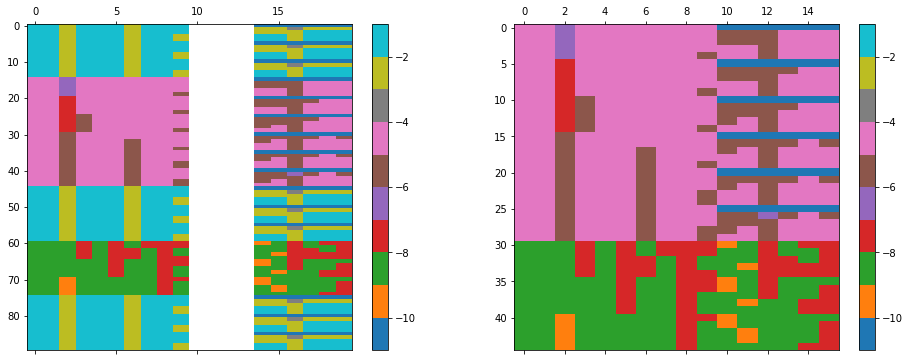

In [104]:
plt.subplot(121)
plt.matshow(np.log10(np.abs(X.real)), aspect='auto', fignum=False, vmax=-1., vmin=-11., cmap='tab10')
plt.colorbar()

plt.subplot(122)
plt.matshow(np.log10(np.abs(XX.real)), aspect='auto', fignum=False, vmax=-1., vmin=-11., cmap='tab10')
plt.colorbar()

plt.gcf().set_size_inches((16., 6.))

(20, 20)


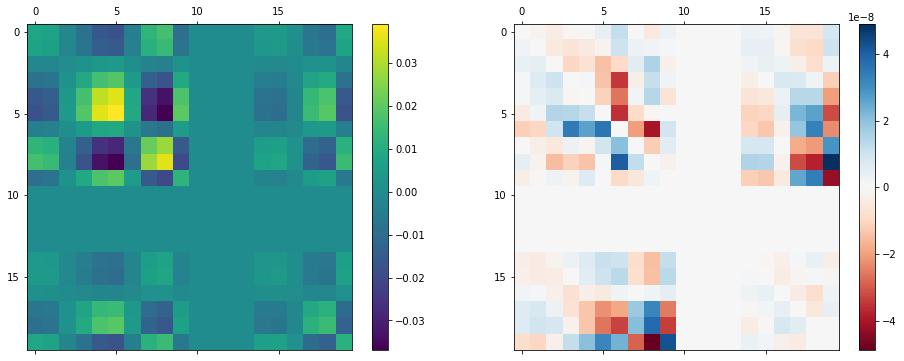

In [90]:
XdX = np.matmul(X.T.conj(), X)
print(XdX.shape)

plt.subplot(121)
plt.matshow(XdX.real, aspect='auto', fignum=False)
plt.colorbar()

plt.subplot(122)
plt.matshow(XdX.imag, aspect='auto', fignum=False, cmap='RdBu')
plt.colorbar()

plt.gcf().set_size_inches((16., 6.))

(16, 16)


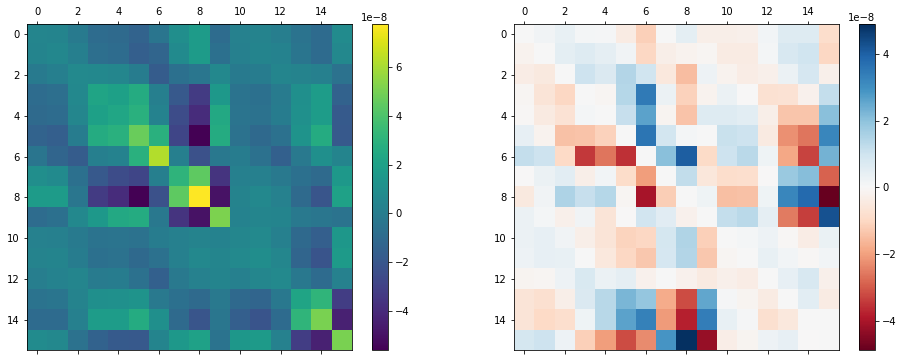

In [107]:
XdX1 = np.matmul(XX.T, XX.conj())
print(XdX1.shape)

plt.subplot(121)
plt.matshow(XdX1.real, aspect='auto', fignum=False)
plt.colorbar()

plt.subplot(122)
plt.matshow(XdX1.imag, aspect='auto', fignum=False, cmap='RdBu')
plt.colorbar()

plt.gcf().set_size_inches((16., 6.))

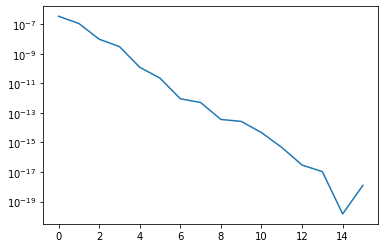

In [108]:
plt.plot(np.linalg.eigvals(XdX1).real)
plt.yscale('log')

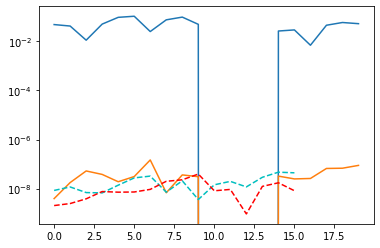

In [109]:
# Apply XdX operator to real vector
xvec0 = np.random.randn(XdX.shape[-1])
y0 = np.dot(XdX, xvec0)

xvec1 = np.random.randn(XdX1.shape[-1])
y1 = np.dot(XdX1, xvec1)

plt.plot(np.abs(y0.real))
plt.plot(np.abs(y0.imag))
plt.plot(np.abs(y1.real), 'c--')
plt.plot(np.abs(y1.imag), 'r--')
plt.yscale('log')

[0.00811611 0.00616436 0.0004363  0.00887577 0.03183318 0.03909067
 0.00222483 0.02146354 0.03579535 0.01238315 0.         0.
 0.         0.         0.00307742 0.00377903 0.00021508 0.00888446
 0.01481687 0.0115029 ]


/tmp/ipykernel_218739/2780451783.py:1: RuntimeWarning: divide by zero encountered in log10
  plt.plot(np.log10(np.diag(XdX).real))


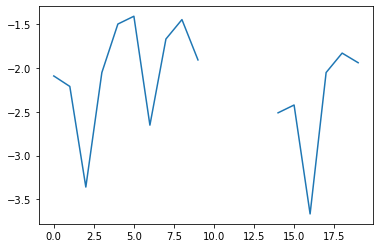

In [37]:
plt.plot(np.log10(np.diag(XdX).real))
print(np.diag(XdX).real)

In [20]:
antpairs

[(0, 0), (0, 1), (0, 2), (1, 1), (1, 2), (2, 2)]

In [23]:
ell

array([0, 1, 2, 3, 1, 2, 3, 2, 3, 3])

In [24]:
m

array([0, 0, 0, 0, 1, 1, 1, 2, 2, 3])

/tmp/ipykernel_218739/1641949086.py:1: RuntimeWarning: invalid value encountered in true_divide
  plt.matshow(np.log10(np.abs(vis_response[1,0].real / vis_response[0,0].real)))


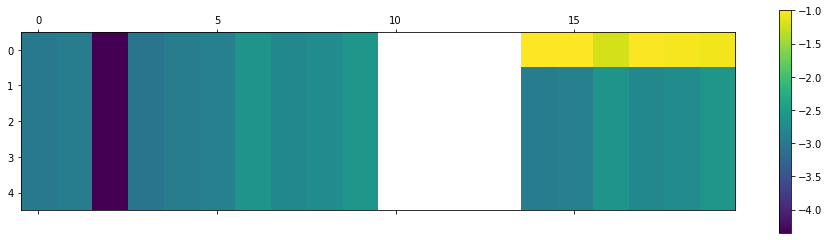

In [56]:
plt.matshow(np.log10(np.abs(vis_response[1,0].real / vis_response[0,0].real)))
plt.colorbar()

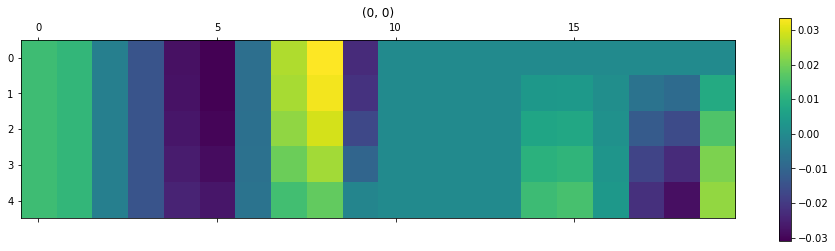

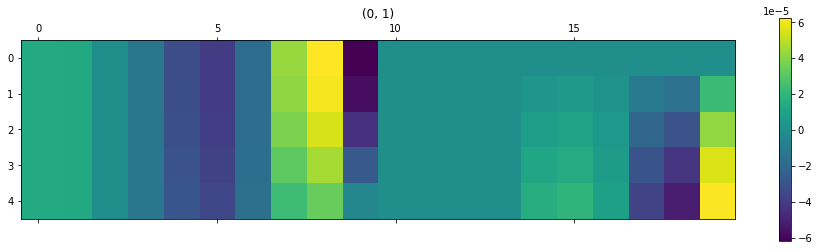

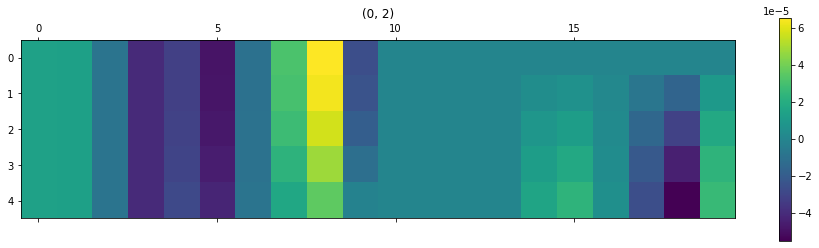

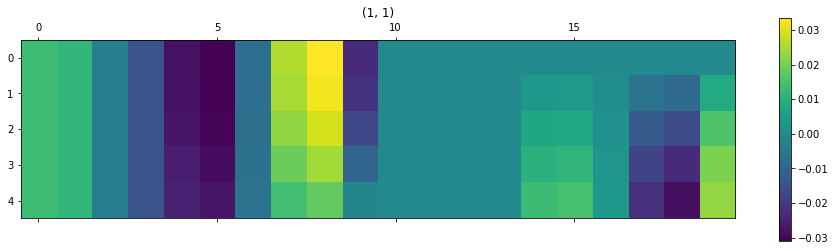

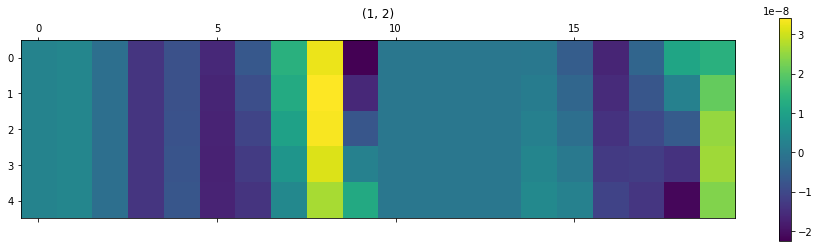

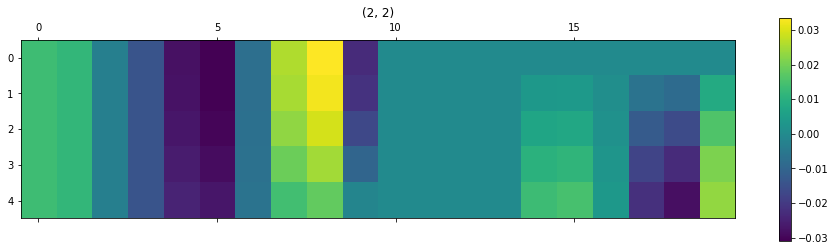

In [22]:
for i in range(vis_response.shape[0]):
    plt.matshow(vis_response[i,0].real)
    plt.title("%s" % str(antpairs[i]))
    plt.colorbar()
    plt.show()

/tmp/ipykernel_91963/2804073133.py:3: RuntimeWarning: divide by zero encountered in log10
  plt.matshow(np.log10(np.abs(aa.real)), aspect='auto', fignum=False) #, vmin=-minmax, vmax=minmax, cmap='RdBu')
/tmp/ipykernel_91963/2804073133.py:15: RuntimeWarning: divide by zero encountered in log10
  plt.matshow(np.log10(np.abs(aa.imag)), aspect='auto', fignum=False) #, vmin=-minmax, vmax=minmax, cmap='RdBu')


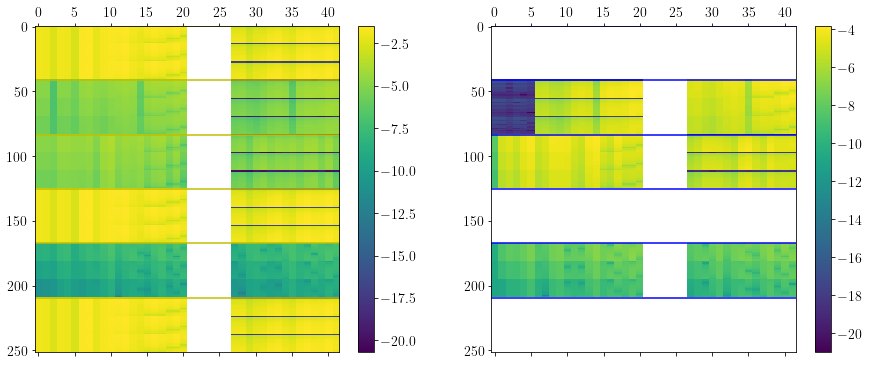

In [70]:
plt.subplot(121)
minmax = np.abs(aa.real).max()
plt.matshow(np.log10(np.abs(aa.real)), aspect='auto', fignum=False) #, vmin=-minmax, vmax=minmax, cmap='RdBu')
for i in range(vis_response.shape[0]):
    plt.axhline(freqs[:3].size * _lsts.size * i - 0.5, color='y')

#ell, m = hp.Alm().getlm(lmax=5)    
#for i in range(ell.size):
#    if m[i] == 0.:
#        plt.axvline(2*i+1, ls='dashed', color='m')
plt.colorbar()

plt.subplot(122)
minmax = np.abs(aa.imag).max()
plt.matshow(np.log10(np.abs(aa.imag)), aspect='auto', fignum=False) #, vmin=-minmax, vmax=minmax, cmap='RdBu')
for i in range(vis_response.shape[0]):
    plt.axhline(freqs[:3].size * _lsts.size * i - 0.5, color='b')
plt.colorbar()

# y axis:
# 3 frequencies per block
# each block is a baseline, ordering 0,0; 0,1; 0,2...; 1,1; 1,2...
# x axis:
# a_lm modes, real and imaginary, in some ordering

plt.gcf().set_size_inches((15., 6.))

In [82]:
# Cut out the modes that are forced to be zero
aa_cut = np.zeros((aa.shape[0], aa.shape[1]-3), dtype=np.complex128)
aa_cut[:,:21] = aa[:,:21]
aa_cut[:,21:] = aa[:,21+3:]

bb = np.matmul(aa_cut.T.conj(), aa_cut)
bb.shape


bb = bb + 0.01 * np.eye(bb.shape[0])

divide by zero encountered in log10
divide by zero encountered in log10


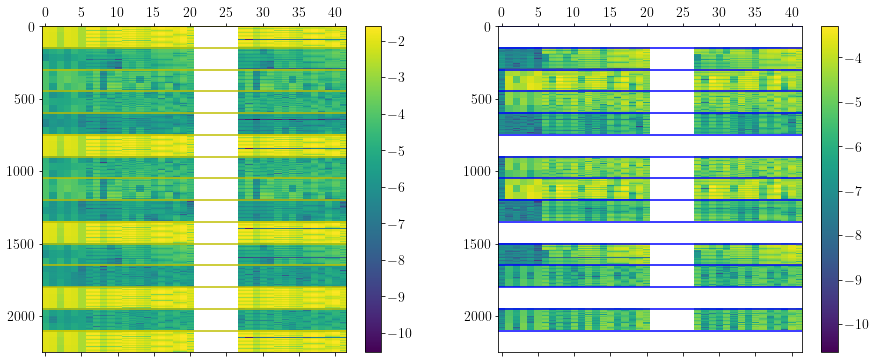

In [65]:
plt.subplot(121)
minmax = np.abs(aa.real).max()
plt.matshow(np.log10(np.abs(aa.real)), aspect='auto', fignum=False) #, vmin=-minmax, vmax=minmax, cmap='RdBu')
for i in range(vis_response.shape[0]):
    plt.axhline(freqs[:3].size * _lsts.size * i - 0.5, color='y')

#ell, m = hp.Alm().getlm(lmax=5)    
#for i in range(ell.size):
#    if m[i] == 0.:
#        plt.axvline(2*i+1, ls='dashed', color='m')
plt.colorbar()

plt.subplot(122)
minmax = np.abs(aa.imag).max()
plt.matshow(np.log10(np.abs(aa.imag)), aspect='auto', fignum=False) #, vmin=-minmax, vmax=minmax, cmap='RdBu')
for i in range(vis_response.shape[0]):
    plt.axhline(freqs[:3].size * _lsts.size * i - 0.5, color='b')
plt.colorbar()

# y axis:
# 3 frequencies per block
# each block is a baseline, ordering 0,0; 0,1; 0,2...; 1,1; 1,2...
# x axis:
# a_lm modes, real and imaginary, in some ordering

plt.gcf().set_size_inches((15., 6.))

In [ ]:
"""
idx = 0, ell = 0, m = 0   yn
idx = 2, ell = 1, m = 0   yn
idx = 4, ell = 2, m = 0   ny
idx = 6, ell = 3, m = 0   ny
idx = 8, ell = 1, m = 1   nn
idx = 10, ell = 2, m = 1  xx
idx = 12, ell = 3, m = 1  xx
idx = 14, ell = 2, m = 2  ny
idx = 16, ell = 3, m = 2  ny
idx = 18, ell = 3, m = 3  nn
"""

idx = 0, ell = 0, m = 0
idx = 2, ell = 1, m = 0
idx = 4, ell = 2, m = 0
idx = 6, ell = 3, m = 0
idx = 8, ell = 4, m = 0
idx = 10, ell = 5, m = 0
idx = 12, ell = 1, m = 1
idx = 14, ell = 2, m = 1
idx = 16, ell = 3, m = 1
idx = 18, ell = 4, m = 1
idx = 20, ell = 5, m = 1
idx = 22, ell = 2, m = 2
idx = 24, ell = 3, m = 2
idx = 26, ell = 4, m = 2
idx = 28, ell = 5, m = 2
idx = 30, ell = 3, m = 3
idx = 32, ell = 4, m = 3
idx = 34, ell = 5, m = 3
idx = 36, ell = 4, m = 4
idx = 38, ell = 5, m = 4
idx = 40, ell = 5, m = 5


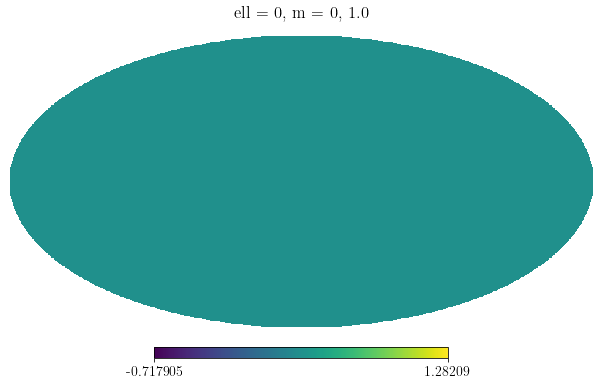

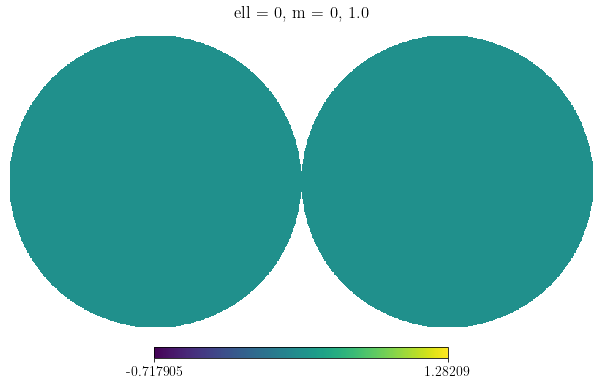

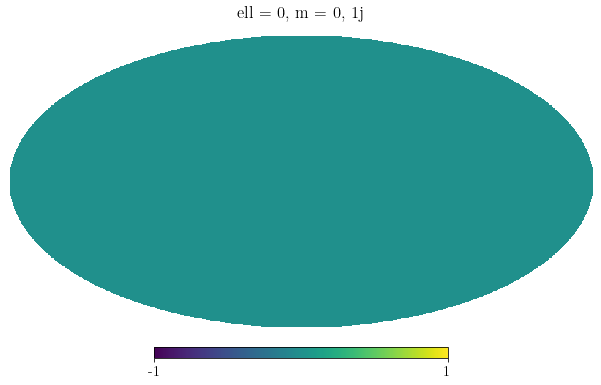

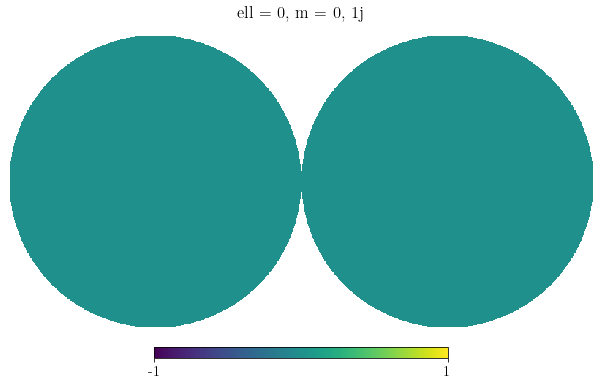

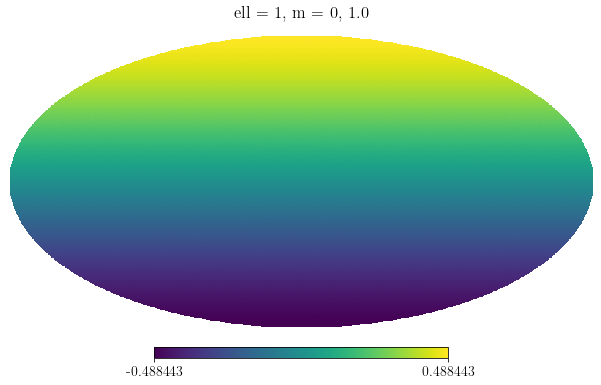

...

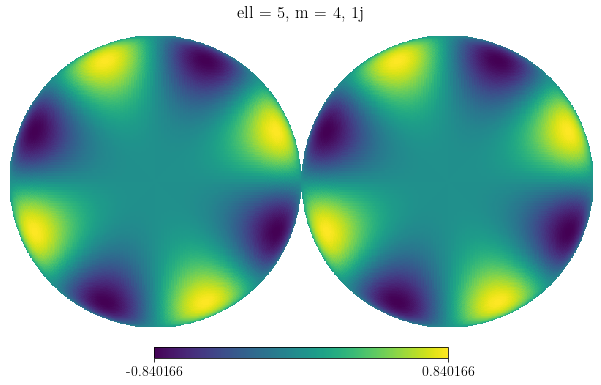

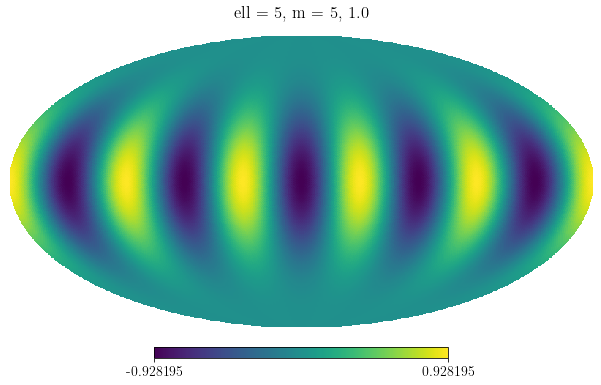

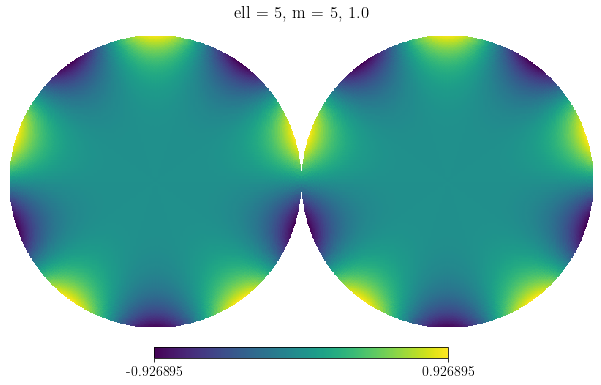

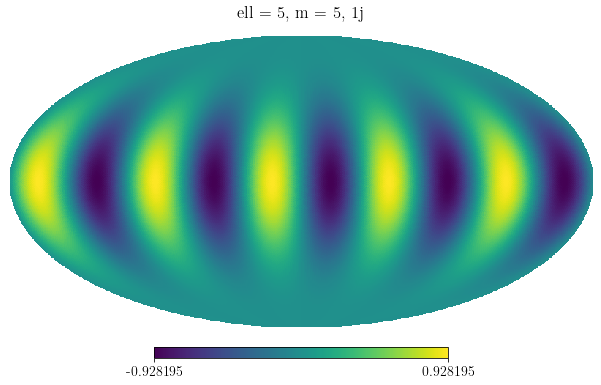

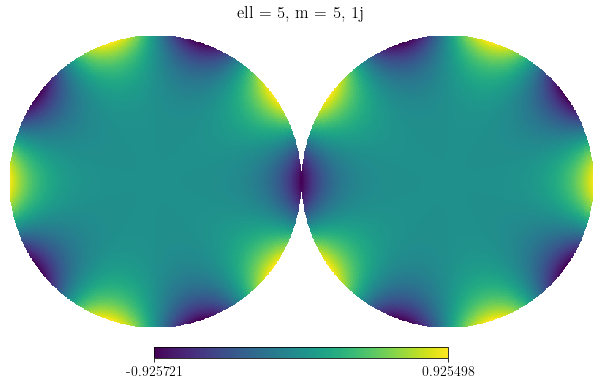

In [217]:
import healpy as hp
# Loop over (ell, m) modes, weighting the precomputed visibility sim
# by the value of each spherical harmonic mode in each pixel

# Array of ell, m values in healpy ordering
ell, m = hp.Alm().getlm(lmax=5)
for n in range(ell.size):
    print("idx = %d, ell = %d, m = %d" % (2*n, ell[n], m[n]))

alm = np.zeros(ell.size, dtype=np.complex128)
for n in range(ell.size):

    # Start with zero vector for all modes
    alm *= 0

    # Loop over real, imaginary values for this mode only
    for j, val in enumerate([1., 1.j]):

        # Make healpix map for this mode only
        alm[n] = val
        skymap = hp.alm2map(alm, nside=nside) #* pix_area
        
        hp.mollview(skymap)
        plt.title("ell = %d, m = %d, %s" % (ell[n], m[n], val))
        plt.show()
        
        hp.orthview(skymap, rot=(0., 90., 0.))
        plt.title("ell = %d, m = %d, %s" % (ell[n], m[n], val))
        plt.show()

In [268]:
def build_hex_array(hex_spec=(3,4), ants_per_row=None, d=14.6):
    """
    Build an antenna position dict for a hexagonally close-packed array.
    
    Parameters
    ----------
    hex_spec : tuple, optional
        If `ants_per_row = None`, this is used to specify a hex array as 
        `hex_spec = (nmin, nmax)`, where `nmin` is the number of antennas in 
        the bottom and top rows, and `nmax` is the number in the middle row. 
        The number per row increases by 1 until the middle row is reached.
        
        Default: (3,4) [a hex with 3,4,3 antennas per row]
    
    ants_per_row : array_like, optional
        Number of antennas per row. Default: None.
    
    d : float, optional
        Minimum baseline length between antennas in the hex array, in meters. 
        Default: 14.6.
    
    Returns
    -------
    ants : dict
        Dictionary with antenna IDs as the keys, and tuples with antenna 
        (x, y, z) position values (with respect to the array center) as the 
        values. Units: meters.
    """
    ants = {}
    
    # If ants_per_row isn't given, build it from hex_spec
    if ants_per_row is None:
        r = np.arange(hex_spec[0], hex_spec[1]+1).tolist()
        ants_per_row = r[:-1] + r[::-1]
    
    # Assign antennas
    k = -1
    y = 0.
    dy = d * np.sqrt(3) / 2. # delta y = d sin(60 deg)
    for j, r in enumerate(ants_per_row):
        
        # Calculate y coord and x offset
        y = -0.5 * dy * (len(ants_per_row)-1) + dy * j
        x = np.linspace(-d*(r-1)/2., d*(r-1)/2., r)
        for i in range(r):
            k += 1
            ants[k] = (x[i], y, 0.)
            
    return ants

In [ ]:
#ant_pos = build_hex_array(hex_spec)

## Realified matrix solver

In [269]:
# Make X (projection operator)
lst_ref = 1.
latitude = -30.7215 * np.pi / 180.
lmax = 40

ant_pos = {0: (0., 0., 0.), 
           1: (14., 0., 0.),
           2: (0., 14., 0.),
           3: (14., 14., 0.),
           4: (-14., 14., 0.),
           5: (28., 0., 0.),
           6: (0., 28., 0.),
           7: (28., 28., 0.),
           8: (-28., 28., 0.),
           9: (42., 0., 0.),
           10: (0., 42., 0.),
           11: (42., 42., 0.),
           12: (-42., 42., 0.),
           13: (4.*14, 0., 0.),
           14: (0., 4.*14, 0.),
           15: (4.*14, 4.*14, 0.),
           16: (-4.*14, 4.*14, 0.),
           17: (5.*14, 0., 0.),
           18: (0., 5.*14, 0.),
           19: (5.*14, 5.*14, 0.),
           20: (-5.*14, 5.*14, 0.),
          }

freqs = np.linspace(100e6, 110e6, 1)
lsts = np.linspace(0.01, 2., 2)
beams = [pyuvsim.AnalyticBeam('gaussian', sigma=np.deg2rad(10.)) for ant in ant_pos]

# Get raw projection operator
t0 = time.time()
%memit vis_response, _antpairs, _ell, _m = vis_proj_operator_lsts(freqs, lsts, beams, ant_pos, lmax=lmax, nside=128, latitude=latitude)
print("Run took %5.3f sec" % (time.time() - t0))

# Trim unwanted entries
t0 = time.time()
%memit Xarr, antpairs, ell, m = trim_X_operator(vis_response, _antpairs, _ell, _m)
print("Run took %5.3f sec" % (time.time() - t0))
X = Xarr.reshape((-1, Xarr.shape[-1]))

peak memory: 6012.68 MiB, increment: 5292.62 MiB
Run took 1148.928 sec
(231, 1, 2, 1722) 231 861 861
[  0  21  41  60  78  95 111 126 140 153 165 176 186 195 203 210 216 221
 225 228 230]
(231, 1, 2, 1722) 231 861 861
[  0  21  41  60  78  95 111 126 140 153 165 176 186 195 203 210 216 221
 225 228 230]
(231, 1, 2, 1722) 231 861 861
[  0  21  41  60  78  95 111 126 140 153 165 176 186 195 203 210 216 221
 225 228 230]
peak memory: 730.64 MiB, increment: 9.96 MiB
Run took 0.457 sec


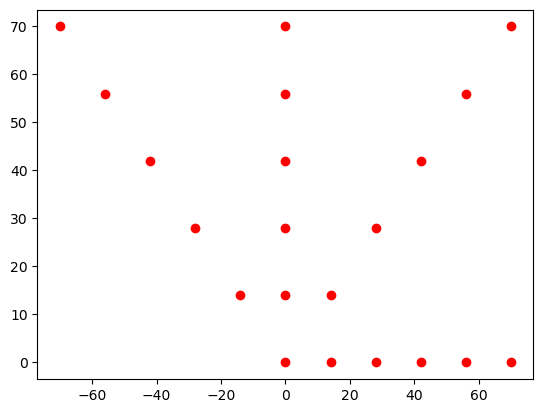

In [270]:
for ant in ant_pos.keys():
    plt.plot(ant_pos[ant][0], ant_pos[ant][1], 'ro')

In [271]:
# Check shape of X operator
print(X.shape)

# Define simple S and N matrices
S = (2e4)**2. * np.eye(X.shape[-1])
N = (0.001)**2. * np.ones((Xarr.shape[0], Xarr.shape[1], Xarr.shape[2])) # actually a vector here

Sinv = np.zeros_like(S)
Sinv[np.diag_indices(S.shape[0])] = 1. / np.diag(S)
Ninv = 1. / N
Ninv = Ninv.flatten()[:,np.newaxis]

# Define example vector
np.random.seed(10)
a_true = 1e4 * np.random.randn(X.shape[-1]) # randomly choose true a_lms
a0 = np.zeros_like(a_true) # Prior mean is zero

# Construct example data
model_true = np.matmul(X, a_true).reshape(N.shape)
data = model_true + np.sqrt(N) * np.random.randn(*N.shape)
data_vec = data.flatten()

(420, 1681)


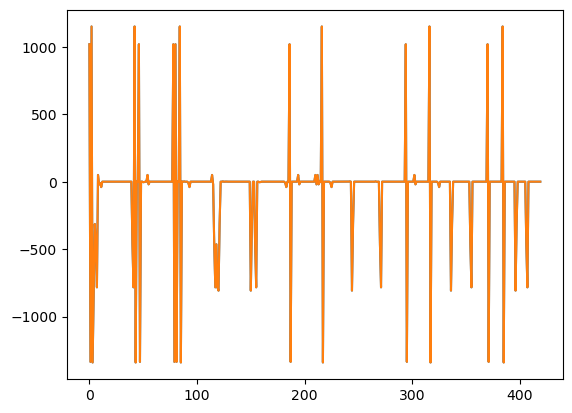

In [272]:
plt.plot(model_true.flatten().real)
plt.plot(data.flatten().real)

(1681, 1681)
3.299e+13


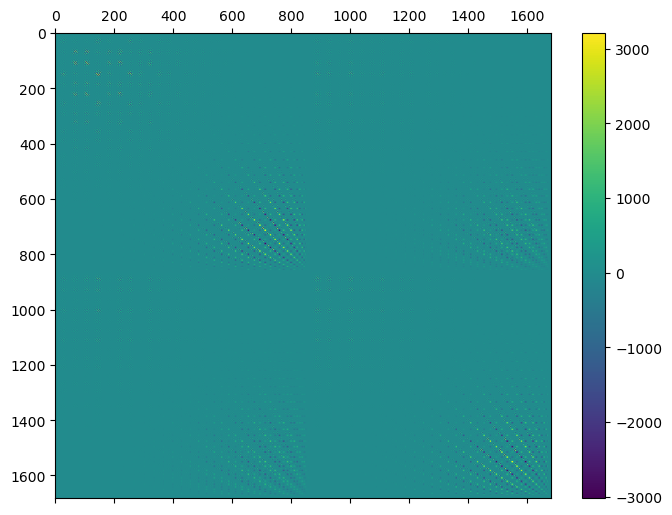

In [273]:
# Construct LHS matrix
# From Eq. 8 of my note
Amat = Sinv \
     + np.matmul(X.real.T, Ninv * X.real) \
     + np.matmul(X.imag.T, Ninv * X.imag)
print(Amat.shape)

plt.matshow(Amat, aspect='auto')
plt.colorbar()
plt.gcf().set_size_inches((8., 6.))

print("%5.3e" % np.linalg.cond(Amat))

In [274]:
# Construct RHS vector
omega_d = np.sqrt(0.5) * (np.random.randn(*data_vec.shape) 
                          + 1.j * np.random.randn(*data_vec.shape))
omega_a = np.random.randn(*a0.shape) # purely real

bvec = np.matmul(X.real.T, Ninv.flatten() * data_vec.real 
                          + np.sqrt(Ninv.flatten()) * omega_d.real) \
     + np.matmul(X.imag.T, Ninv.flatten() * data_vec.imag 
                          + np.sqrt(Ninv.flatten()) * omega_d.imag) \
     + np.matmul(Sinv, a0) \
     + np.matmul(np.sqrt(Sinv), omega_a)

print(bvec)

[   -46869.23732586    -29320.08035942     45816.30705487 ...
  -4046496.48820824 -11202844.92308767  -1602095.17893523]


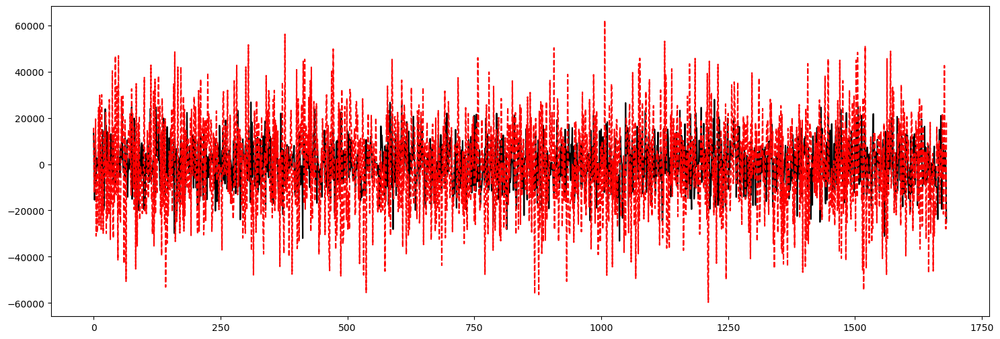

In [275]:
# Try solving
a_soln = np.linalg.solve(Amat, bvec)

plt.plot(a_true, 'k-')
plt.plot(a_soln, 'r--')
plt.gcf().set_size_inches((18., 6.))

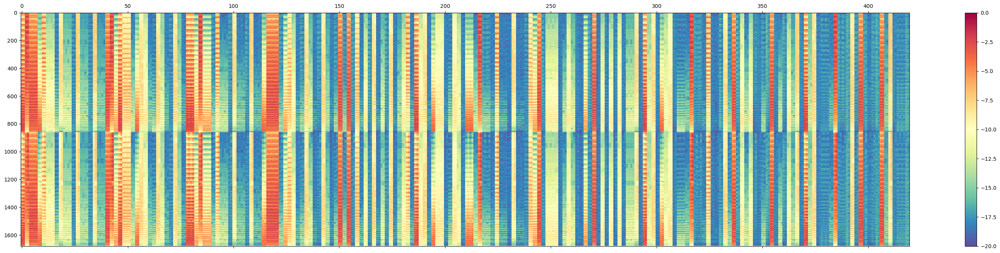

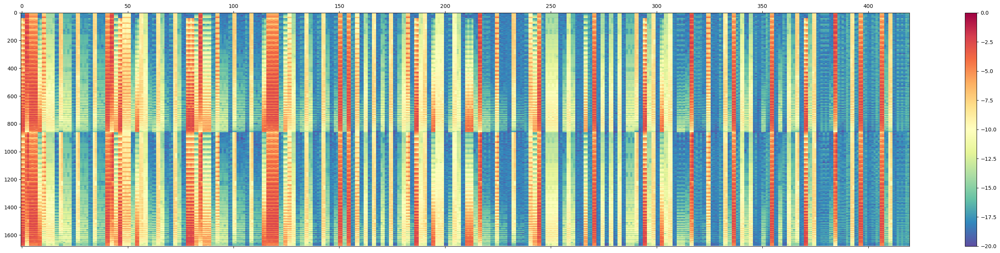

In [278]:
plt.matshow(np.log10(np.abs(X.real)).T, aspect='auto', vmin=-20, vmax=0, cmap='Spectral_r')
plt.colorbar()
plt.gcf().set_size_inches((38., 8.))
plt.show()

plt.matshow(np.log10(np.abs(X.imag)).T, aspect='auto', vmin=-20, vmax=0, cmap='Spectral_r')
plt.colorbar()
plt.gcf().set_size_inches((38., 8.))
plt.show()

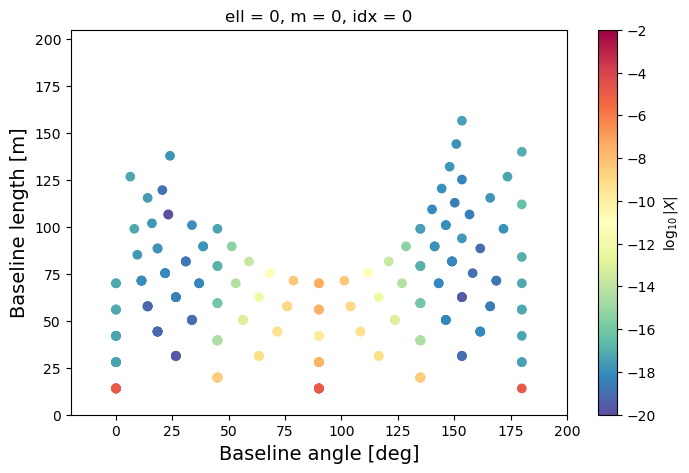

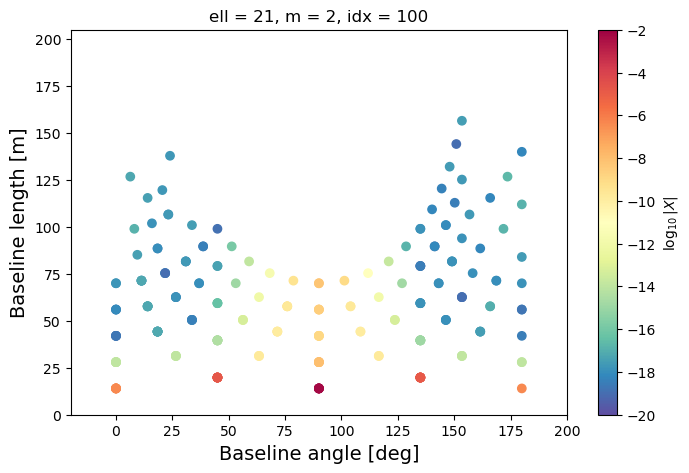

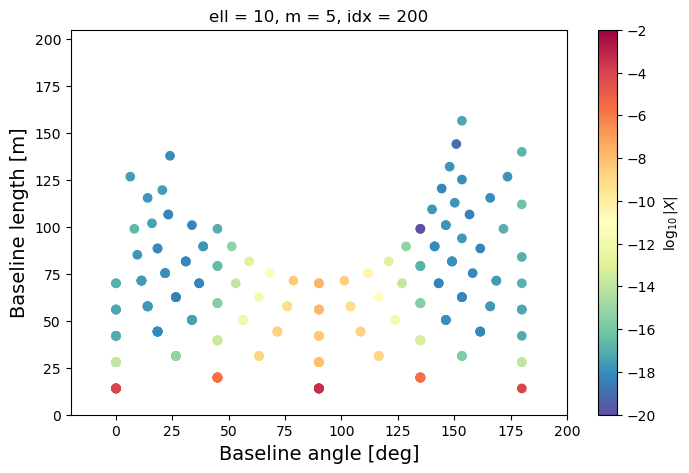

In [288]:
for idx in [0, 100, 200]: #np.arange(len(ell)):
    angs = []
    logmags = []
    bllens = []
    for i, bl in enumerate(antpairs):
        x1, y1, z1 = ant_pos[bl[0]]
        x2, y2, z2 = ant_pos[bl[1]]
        bllen = np.sqrt((x1 - x2)**2. + (y1 - y2)**2.)
        ang = np.arccos((x2 - x1) / bllen) * 180. / np.pi
        logmag = np.log10(np.abs(Xarr[i,0,1,idx].real))
        # Xarr Shape: (Nbls, Nfreqs, Nlsts, Nmodes)
        #print("%03d" % i, "%10s" % str(bl), "%7.1f" % logmag, "%7.2f m" % bllen, "%7.1f deg" % ang)

        bllens.append(bllen)
        angs.append(ang)
        logmags.append(logmag)

    plt.scatter(angs, bllens, c=logmags, cmap='Spectral_r', vmax=-2., vmin=-20.)
    plt.title("ell = %d, m = %d, idx = %d" % (ell[idx], m[idx], idx))
    plt.colorbar(label="$\log_{10}|X|$")
    plt.xlim((-20., 200.))
    plt.ylim((0., 205.))
    
    plt.xlabel("Baseline angle [deg]", fontsize=14)
    plt.ylabel("Baseline length [m]", fontsize=14)
    plt.gcf().set_size_inches((8., 5.))
    plt.show()

In [189]:
m

array([0, 0, 0, 0, 1, 1, 1, 2, 2, 3, 1, 1, 1, 2, 2, 3])

In [190]:
ell

array([0, 1, 2, 3, 1, 2, 3, 2, 3, 3, 1, 2, 3, 2, 3, 3])

In [ ]:
#############################################################################################################
#############################################################################################################
#############################################################################################################

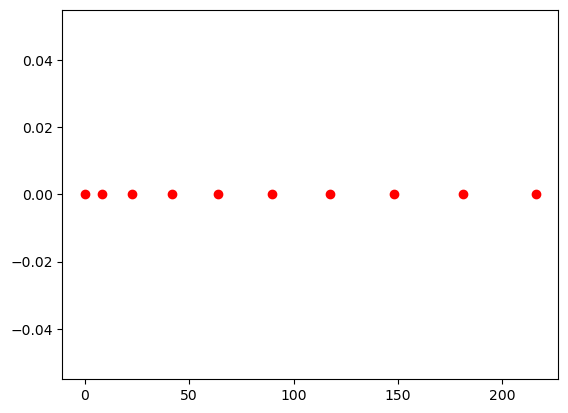

peak memory: 2642.16 MiB, increment: 1200.28 MiB
Run took 338.201 sec
(55, 1, 2, 1722) 55 861 861
[ 0 10 19 27 34 40 45 49 52 54]
(55, 1, 2, 1722) 55 861 861
[ 0 10 19 27 34 40 45 49 52 54]
(55, 1, 2, 1722) 55 861 861
[ 0 10 19 27 34 40 45 49 52 54]
peak memory: 1442.27 MiB, increment: 0.04 MiB
Run took 0.498 sec


In [290]:
# Make X (projection operator)
lst_ref = 1.
latitude = -30.7215 * np.pi / 180.
lmax = 40

ant_pos2 = {}
for i in range(10):
    ant_pos2[i] = (i**1.5 * 8., 0., 0.)

for ant in ant_pos2.keys():
    plt.plot(ant_pos2[ant][0], ant_pos2[ant][1], 'ro')
plt.show()
    
freqs2 = np.linspace(100e6, 110e6, 1)
lsts2 = np.linspace(0.01, 2., 2)
beams2 = [pyuvsim.AnalyticBeam('gaussian', sigma=np.deg2rad(10.)) for ant in ant_pos2]

# Get raw projection operator
t0 = time.time()
%memit vis_response2, _antpairs, _ell, _m = vis_proj_operator_lsts(freqs2, lsts2, beams2, ant_pos2, lmax=lmax, nside=128, latitude=latitude)
print("Run took %5.3f sec" % (time.time() - t0))

# Trim unwanted entries
t0 = time.time()
%memit Xarr2, antpairs2, ell2, m2 = trim_X_operator(vis_response2, _antpairs, _ell, _m)
print("Run took %5.3f sec" % (time.time() - t0))
X2 = Xarr2.reshape((-1, Xarr2.shape[-1]))

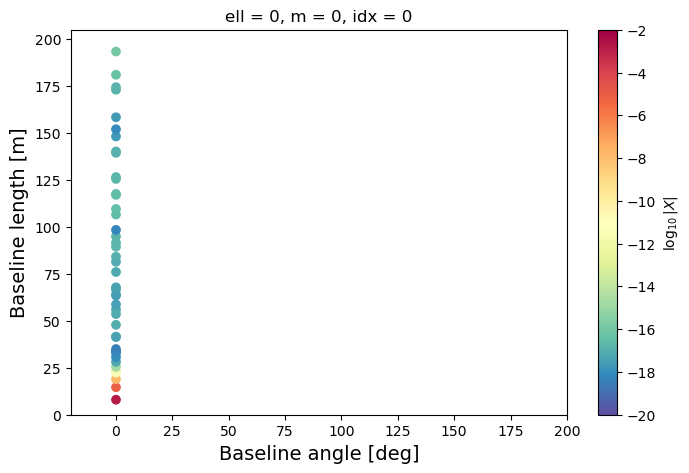

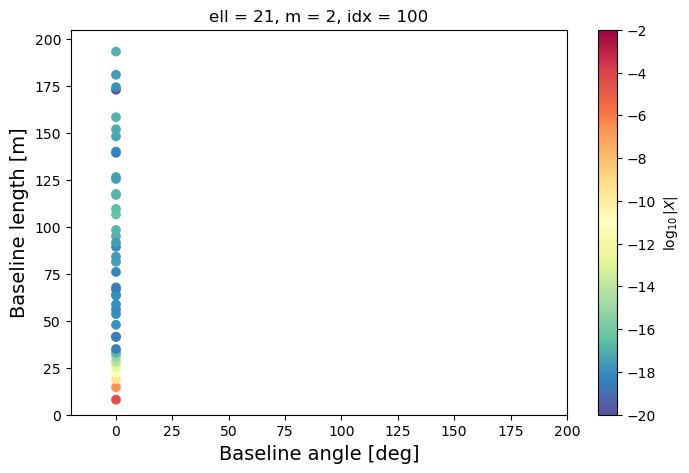

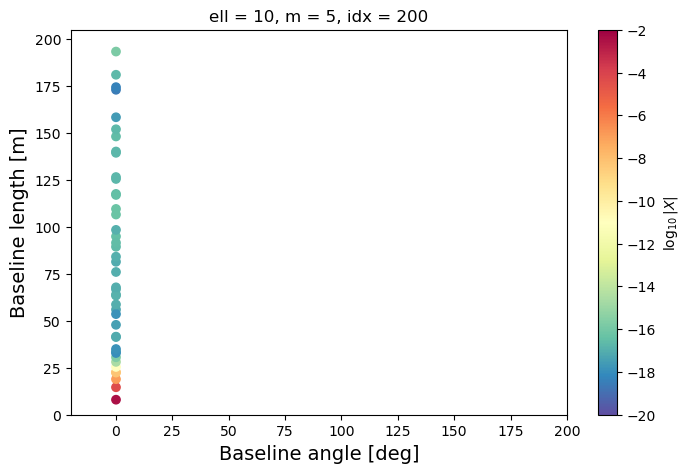

In [291]:
for idx in [0, 100, 200]: #np.arange(len(ell)):
    angs = []
    logmags = []
    bllens = []
    for i, bl in enumerate(antpairs2):
        x1, y1, z1 = ant_pos2[bl[0]]
        x2, y2, z2 = ant_pos2[bl[1]]
        bllen = np.sqrt((x1 - x2)**2. + (y1 - y2)**2.)
        ang = np.arccos((x2 - x1) / bllen) * 180. / np.pi
        logmag = np.log10(np.abs(Xarr2[i,0,1,idx].real))
        # Xarr Shape: (Nbls, Nfreqs, Nlsts, Nmodes)
        #print("%03d" % i, "%10s" % str(bl), "%7.1f" % logmag, "%7.2f m" % bllen, "%7.1f deg" % ang)

        bllens.append(bllen)
        angs.append(ang)
        logmags.append(logmag)

    plt.scatter(angs, bllens, c=logmags, cmap='Spectral_r', vmax=-2., vmin=-20.)
    plt.title("ell = %d, m = %d, idx = %d" % (ell2[idx], m2[idx], idx))
    plt.colorbar(label="$\log_{10}|X|$")
    plt.xlim((-20., 200.))
    plt.ylim((0., 205.))
    
    plt.xlabel("Baseline angle [deg]", fontsize=14)
    plt.ylabel("Baseline length [m]", fontsize=14)
    plt.gcf().set_size_inches((8., 5.))
    plt.show()

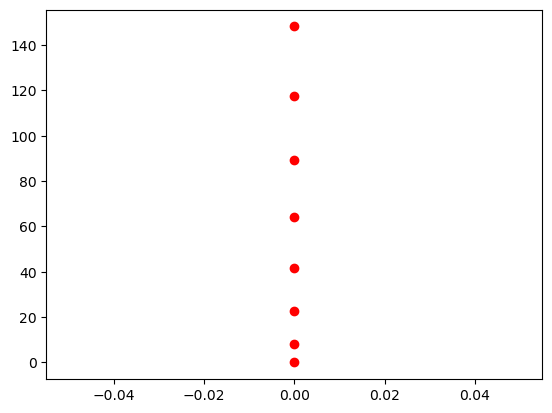

peak memory: 2210.30 MiB, increment: 768.03 MiB
Run took 220.330 sec
(36, 1, 2, 1722) 36 861 861
[ 0  8 15 21 26 30 33 35]
(36, 1, 2, 1722) 36 861 861
[ 0  8 15 21 26 30 33 35]
(36, 1, 2, 1722) 36 861 861
[ 0  8 15 21 26 30 33 35]
peak memory: 1442.30 MiB, increment: 0.00 MiB
Run took 0.510 sec


In [292]:
# Make X (projection operator)
lst_ref = 1.
latitude = -30.7215 * np.pi / 180.
lmax = 40

ant_pos2 = {}
for i in range(8):
    ant_pos2[i] = (0., i**1.5 * 8., 0.)

for ant in ant_pos2.keys():
    plt.plot(ant_pos2[ant][0], ant_pos2[ant][1], 'ro')
plt.show()
    
freqs2 = np.linspace(100e6, 110e6, 1)
lsts2 = np.linspace(0.01, 2., 2)
beams2 = [pyuvsim.AnalyticBeam('gaussian', sigma=np.deg2rad(10.)) for ant in ant_pos2]

# Get raw projection operator
t0 = time.time()
%memit vis_response2, _antpairs, _ell, _m = vis_proj_operator_lsts(freqs2, lsts2, beams2, ant_pos2, lmax=lmax, nside=128, latitude=latitude)
print("Run took %5.3f sec" % (time.time() - t0))

# Trim unwanted entries
t0 = time.time()
%memit Xarr2, antpairs2, ell2, m2 = trim_X_operator(vis_response2, _antpairs, _ell, _m)
print("Run took %5.3f sec" % (time.time() - t0))
X2 = Xarr2.reshape((-1, Xarr2.shape[-1]))

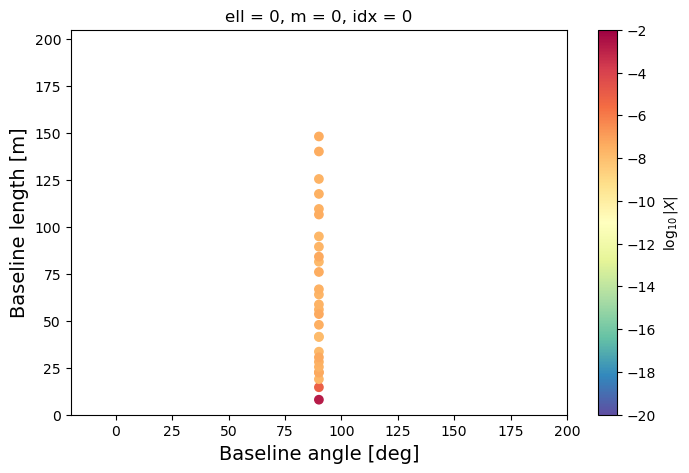

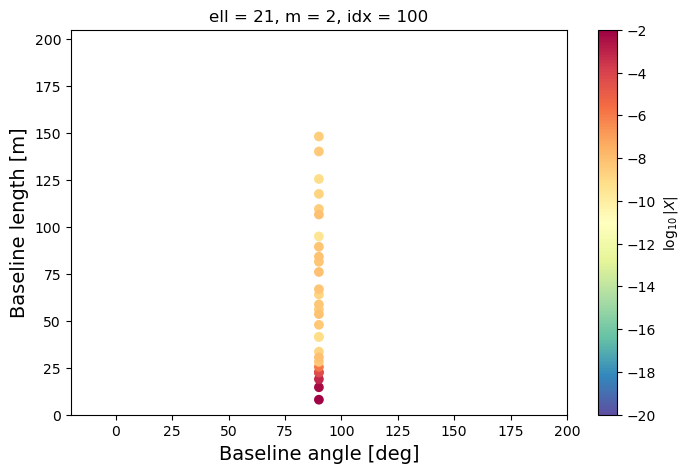

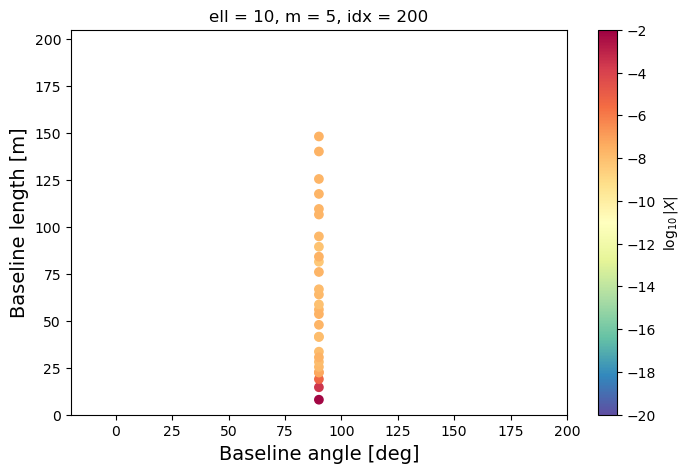

In [293]:
for idx in [0, 100, 200]: #np.arange(len(ell)):
    angs = []
    logmags = []
    bllens = []
    for i, bl in enumerate(antpairs2):
        x1, y1, z1 = ant_pos2[bl[0]]
        x2, y2, z2 = ant_pos2[bl[1]]
        bllen = np.sqrt((x1 - x2)**2. + (y1 - y2)**2.)
        ang = np.arccos((x2 - x1) / bllen) * 180. / np.pi
        logmag = np.log10(np.abs(Xarr2[i,0,1,idx].real))
        # Xarr Shape: (Nbls, Nfreqs, Nlsts, Nmodes)
        #print("%03d" % i, "%10s" % str(bl), "%7.1f" % logmag, "%7.2f m" % bllen, "%7.1f deg" % ang)

        bllens.append(bllen)
        angs.append(ang)
        logmags.append(logmag)

    plt.scatter(angs, bllens, c=logmags, cmap='Spectral_r', vmax=-2., vmin=-20.)
    plt.title("ell = %d, m = %d, idx = %d" % (ell2[idx], m2[idx], idx))
    plt.colorbar(label="$\log_{10}|X|$")
    plt.xlim((-20., 200.))
    plt.ylim((0., 205.))
    
    plt.xlabel("Baseline angle [deg]", fontsize=14)
    plt.ylabel("Baseline length [m]", fontsize=14)
    plt.gcf().set_size_inches((8., 5.))
    plt.show()

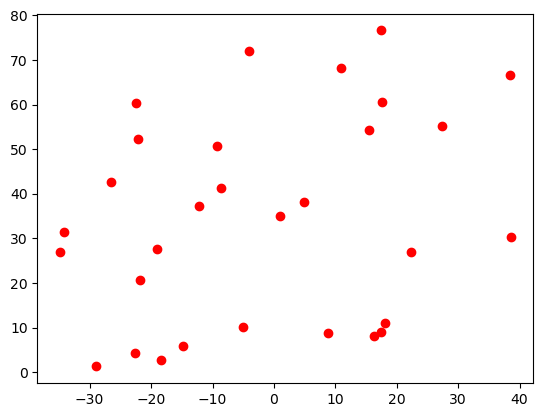

peak memory: 12238.29 MiB, increment: 11350.02 MiB
Run took 59317.648 sec
(465, 1, 2, 20022) 465 10011 10011
[  0  30  59  87 114 140 165 189 212 234 255 275 294 312 329 345 360 374
 387 399 410 420 429 437 444 450 455 459 462 464]
(465, 1, 2, 20022) 465 10011 10011
[  0  30  59  87 114 140 165 189 212 234 255 275 294 312 329 345 360 374
 387 399 410 420 429 437 444 450 455 459 462 464]
peak memory: 1942.06 MiB, increment: 769.50 MiB
Run took 0.631 sec


In [308]:
# Make X (projection operator)
lst_ref = 1.
latitude = -30.7215 * np.pi / 180.
lmax = 140

ant_pos2 = {}
for i in range(30):
    ant_pos2[i] = (np.random.uniform(low=-40., high=40.), np.random.uniform(low=0., high=80.), 0.)

for ant in ant_pos2.keys():
    plt.plot(ant_pos2[ant][0], ant_pos2[ant][1], 'ro')
plt.show()

freqs2 = np.linspace(100e6, 110e6, 1)
lsts2 = np.linspace(0.01, 2., 2)
beams2 = [pyuvsim.AnalyticBeam('gaussian', sigma=np.deg2rad(10.)) for ant in ant_pos2]

# Get raw projection operator
t0 = time.time()
%memit vis_response2, _antpairs, _ell, _m = vis_proj_operator_lsts(freqs2, lsts2, beams2, ant_pos2, lmax=lmax, nside=128, latitude=latitude)
print("Run took %5.3f sec" % (time.time() - t0))

# Trim unwanted entries
t0 = time.time()
%memit Xarr2, antpairs2, ell2, m2 = trim_X_operator(vis_response2, _antpairs, _ell, _m)
print("Run took %5.3f sec" % (time.time() - t0))
X2 = Xarr2.reshape((-1, Xarr2.shape[-1]))

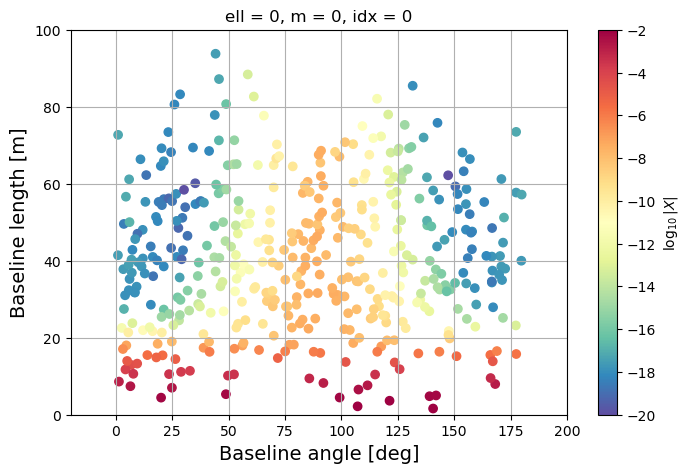

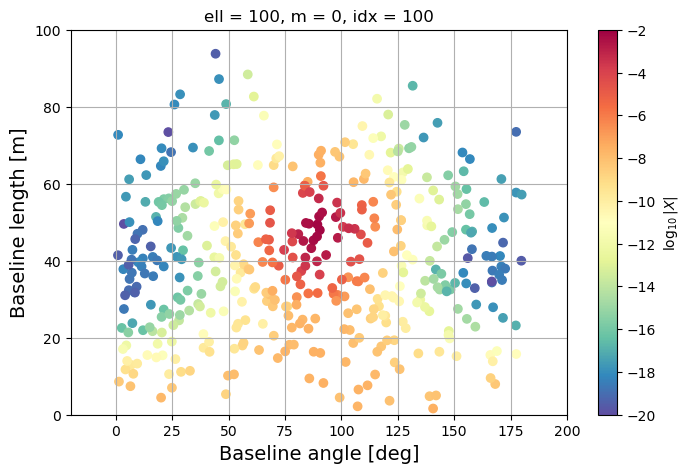

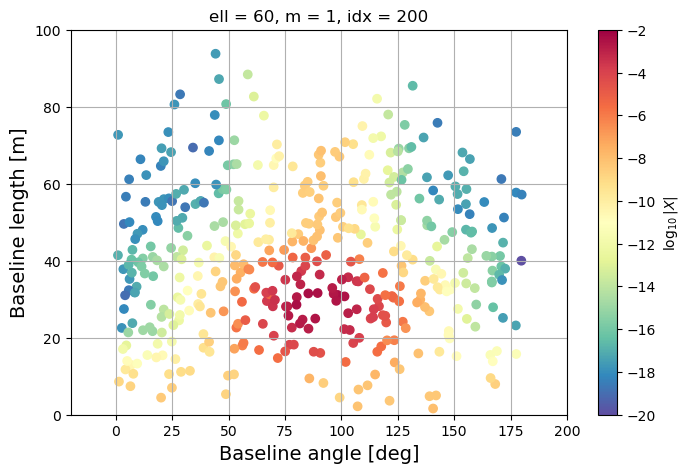

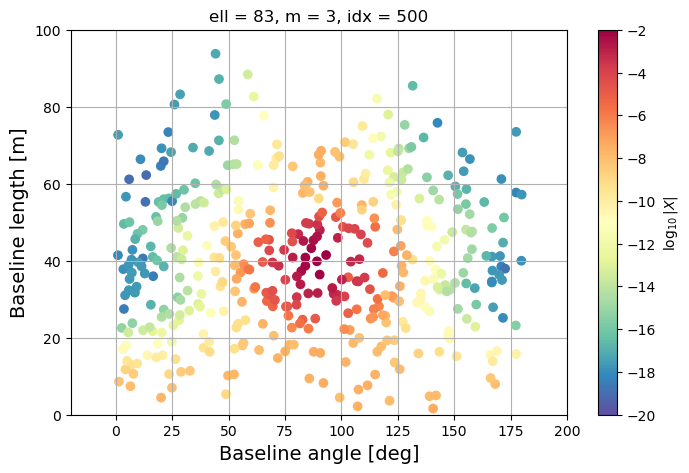

In [309]:
for idx in [0, 100, 200, 500]: #np.arange(len(ell)):
    angs = []
    logmags = []
    bllens = []
    for i, bl in enumerate(antpairs2):
        x1, y1, z1 = ant_pos2[bl[0]]
        x2, y2, z2 = ant_pos2[bl[1]]
        bllen = np.sqrt((x1 - x2)**2. + (y1 - y2)**2.)
        ang = np.arccos((x2 - x1) / bllen) * 180. / np.pi
        logmag = np.log10(np.abs(Xarr2[i,0,1,idx].real))
        # Xarr Shape: (Nbls, Nfreqs, Nlsts, Nmodes)
        #print("%03d" % i, "%10s" % str(bl), "%7.1f" % logmag, "%7.2f m" % bllen, "%7.1f deg" % ang)

        bllens.append(bllen)
        angs.append(ang)
        logmags.append(logmag)

    plt.scatter(angs, bllens, c=logmags, cmap='Spectral_r', vmax=-2., vmin=-20.)
    plt.title("ell = %d, m = %d, idx = %d" % (ell2[idx], m2[idx], idx))
    plt.colorbar(label="$\log_{10}|X|$")
    plt.xlim((-20., 200.))
    plt.ylim((0., 100.))
    plt.grid()
    
    plt.xlabel("Baseline angle [deg]", fontsize=14)
    plt.ylabel("Baseline length [m]", fontsize=14)
    plt.gcf().set_size_inches((8., 5.))
    plt.show()

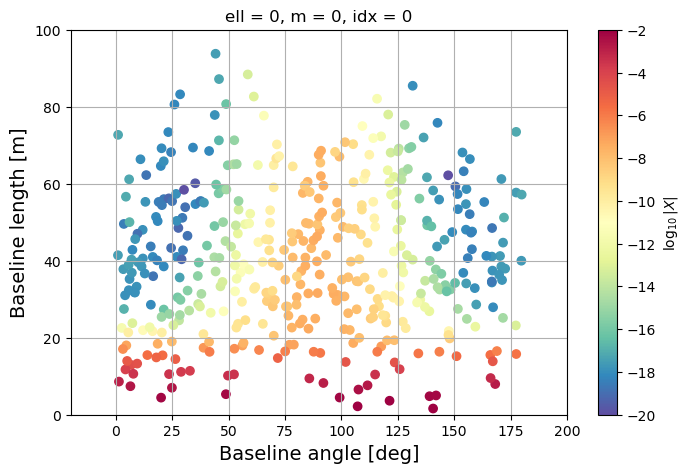

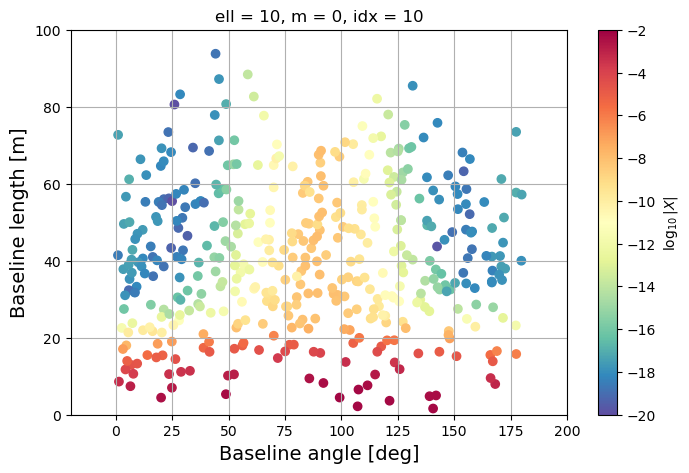

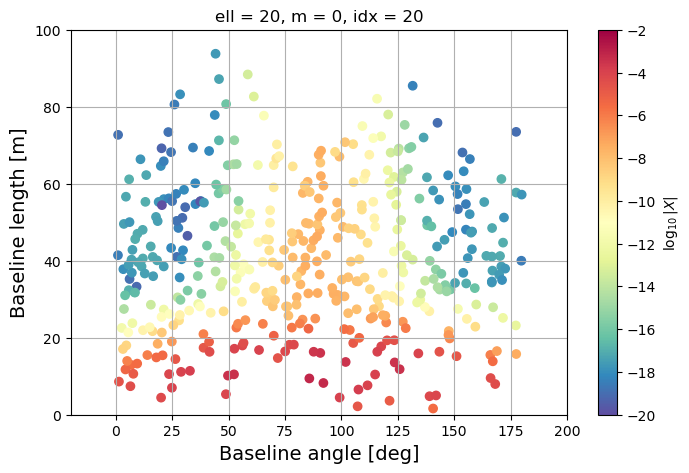

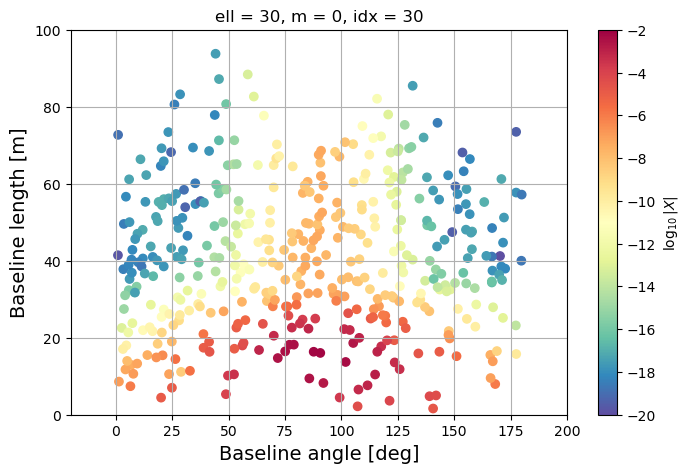

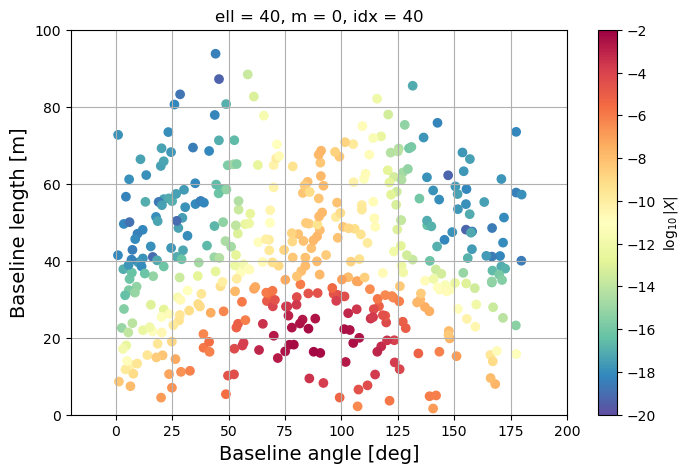

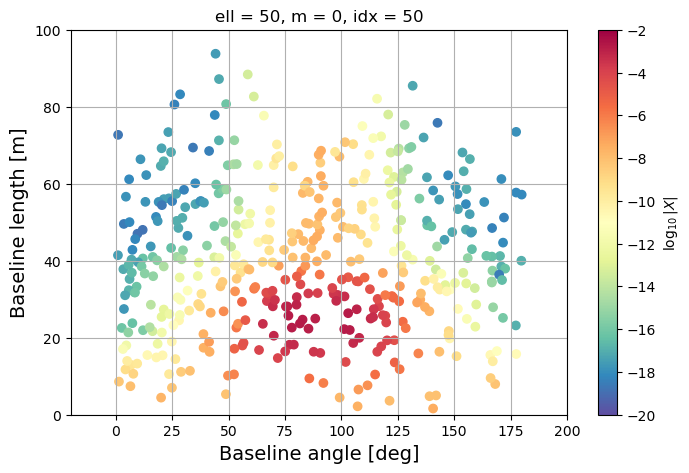

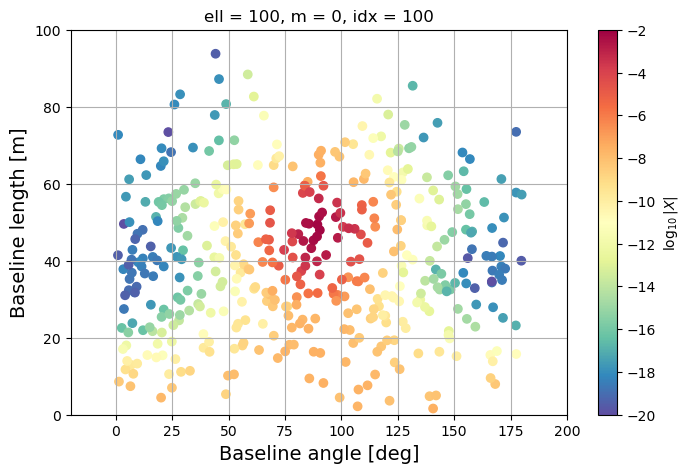

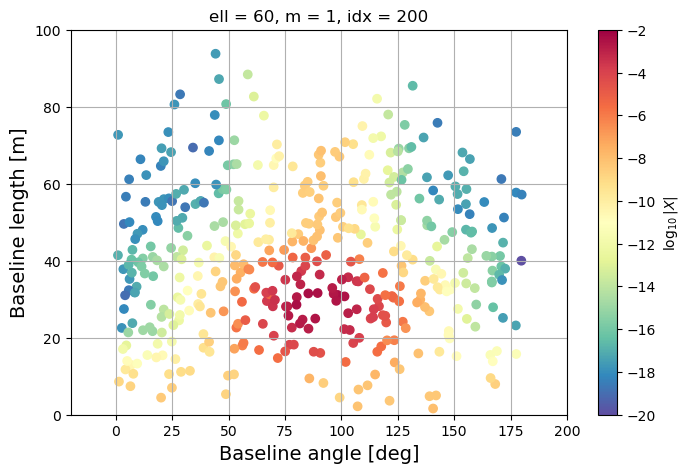

In [311]:
for idx in [0, 10, 20, 30, 40, 50, 100, 200]: #np.arange(len(ell)):
    angs = []
    logmags = []
    bllens = []
    for i, bl in enumerate(antpairs2):
        x1, y1, z1 = ant_pos2[bl[0]]
        x2, y2, z2 = ant_pos2[bl[1]]
        bllen = np.sqrt((x1 - x2)**2. + (y1 - y2)**2.)
        ang = np.arccos((x2 - x1) / bllen) * 180. / np.pi
        logmag = np.log10(np.abs(Xarr2[i,0,1,idx].real))
        # Xarr Shape: (Nbls, Nfreqs, Nlsts, Nmodes)
        #print("%03d" % i, "%10s" % str(bl), "%7.1f" % logmag, "%7.2f m" % bllen, "%7.1f deg" % ang)

        bllens.append(bllen)
        angs.append(ang)
        logmags.append(logmag)

    plt.scatter(angs, bllens, c=logmags, cmap='Spectral_r', vmax=-2., vmin=-20.)
    plt.title("ell = %d, m = %d, idx = %d" % (ell2[idx], m2[idx], idx))
    plt.colorbar(label="$\log_{10}|X|$")
    plt.xlim((-20., 200.))
    plt.ylim((0., 100.))
    plt.grid()
    
    plt.xlabel("Baseline angle [deg]", fontsize=14)
    plt.ylabel("Baseline length [m]", fontsize=14)
    plt.gcf().set_size_inches((8., 5.))
    plt.show()

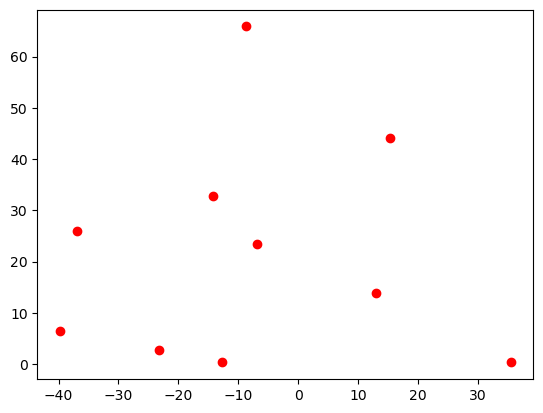

peak memory: 4076.26 MiB, increment: 1215.40 MiB
Run took 1002.008 sec
(55, 1, 2, 5112) 55 2556 2556
[ 0 10 19 27 34 40 45 49 52 54]
(55, 1, 2, 5112) 55 2556 2556
[ 0 10 19 27 34 40 45 49 52 54]
(55, 1, 2, 5112) 55 2556 2556
[ 0 10 19 27 34 40 45 49 52 54]
peak memory: 2881.61 MiB, increment: 5.27 MiB
Run took 0.576 sec


In [312]:
# Make X (projection operator)
lst_ref = 1.
latitude = -30.7215 * np.pi / 180.
lmax = 70

ant_pos3 = {}
for i in range(10):
    ant_pos3[i] = (np.random.uniform(low=-40., high=40.), np.random.uniform(low=0., high=80.), 0.)

for ant in ant_pos3.keys():
    plt.plot(ant_pos3[ant][0], ant_pos3[ant][1], 'ro')
plt.show()

freqs3 = np.linspace(100e6, 110e6, 1)
lsts3 = np.linspace(0.01, 2., 2)
beams3 = [pyuvsim.AnalyticBeam('gaussian', sigma=np.deg2rad(30.)) for ant in ant_pos3]

# Get raw projection operator
t0 = time.time()
%memit vis_response3, _antpairs, _ell, _m = vis_proj_operator_lsts(freqs3, lsts3, beams3, ant_pos3, lmax=lmax, nside=128, latitude=latitude)
print("Run took %5.3f sec" % (time.time() - t0))

# Trim unwanted entries
t0 = time.time()
%memit Xarr3, antpairs3, ell3, m3 = trim_X_operator(vis_response3, _antpairs, _ell, _m)
print("Run took %5.3f sec" % (time.time() - t0))
X3 = Xarr3.reshape((-1, Xarr3.shape[-1]))

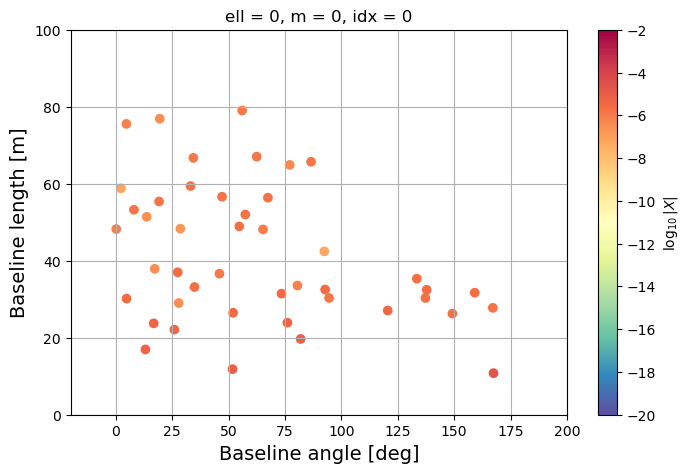

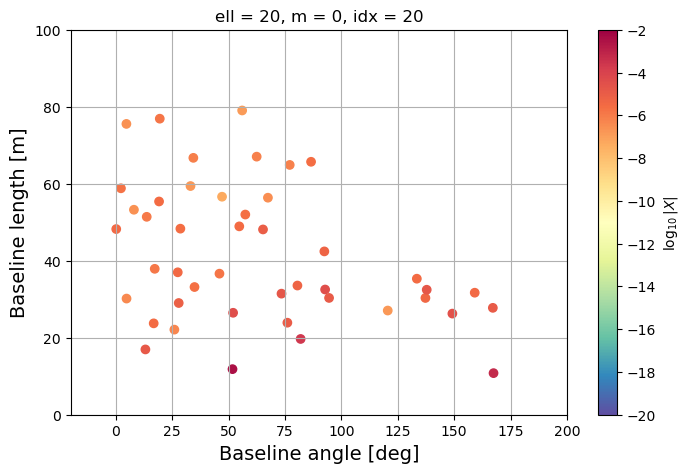

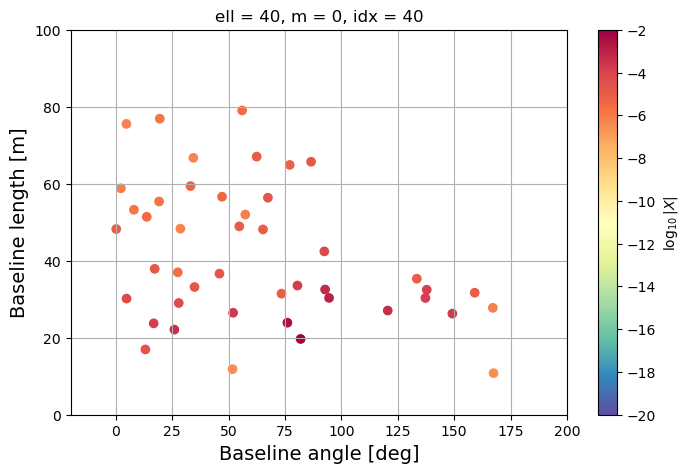

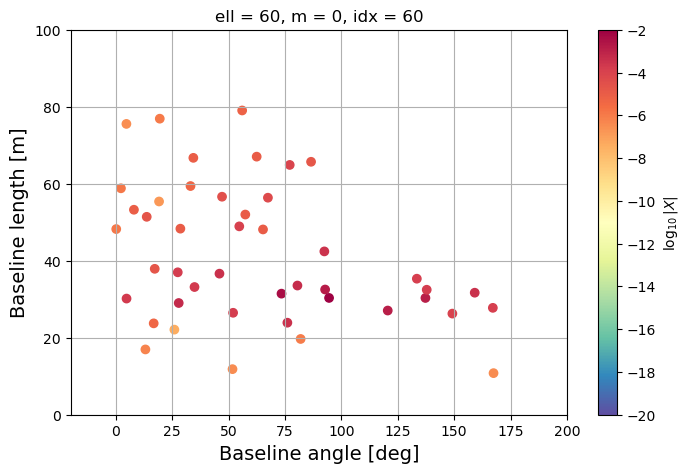

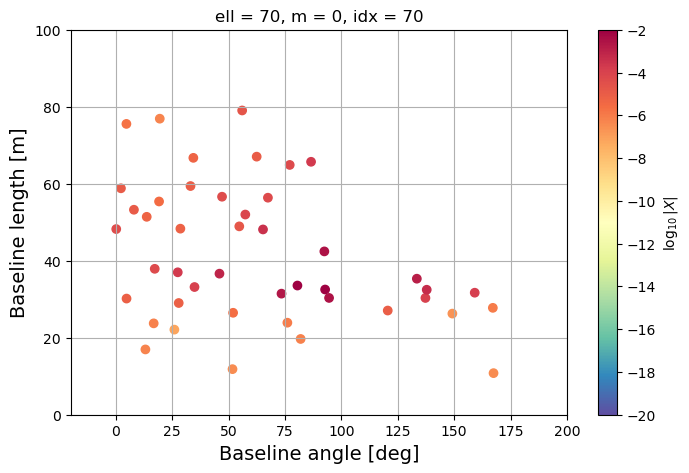

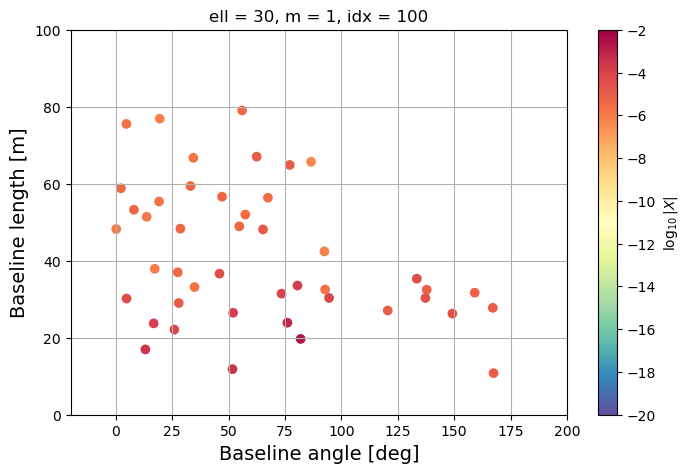

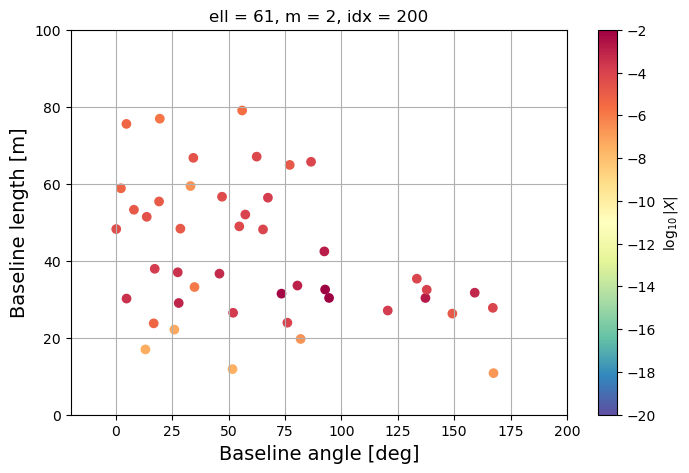

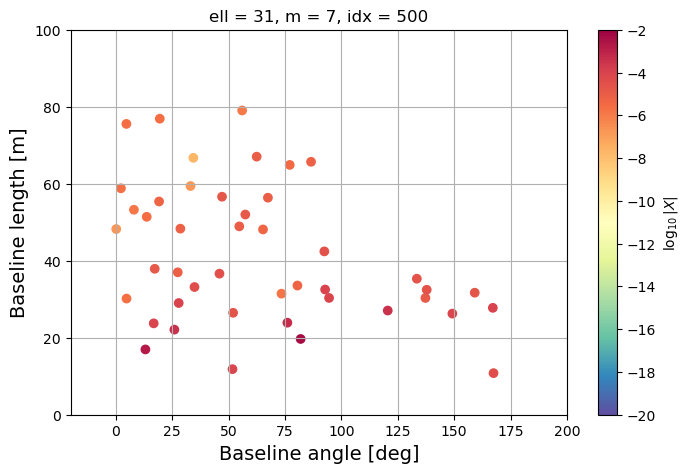

In [322]:
for idx in [0, 20, 40, 60, 70, 100, 200, 500]: #np.arange(len(ell)):
    angs = []
    logmags = []
    bllens = []
    for i, bl in enumerate(antpairs3):
        x1, y1, z1 = ant_pos3[bl[0]]
        x2, y2, z2 = ant_pos3[bl[1]]
        bllen = np.sqrt((x1 - x2)**2. + (y1 - y2)**2.)
        ang = np.arccos((x2 - x1) / bllen) * 180. / np.pi
        logmag = np.log10(np.abs(Xarr3[i,0,1,idx].real))
        # Xarr Shape: (Nbls, Nfreqs, Nlsts, Nmodes)
        #print("%03d" % i, "%10s" % str(bl), "%7.1f" % logmag, "%7.2f m" % bllen, "%7.1f deg" % ang)

        bllens.append(bllen)
        angs.append(ang)
        logmags.append(logmag)

    plt.scatter(angs, bllens, c=logmags, cmap='Spectral_r', vmax=-2., vmin=-20.)
    plt.title("ell = %d, m = %d, idx = %d" % (ell3[idx], m3[idx], idx))
    plt.colorbar(label="$\log_{10}|X|$")
    plt.xlim((-20., 200.))
    plt.ylim((0., 100.))
    plt.grid()
    
    plt.xlabel("Baseline angle [deg]", fontsize=14)
    plt.ylabel("Baseline length [m]", fontsize=14)
    plt.gcf().set_size_inches((8., 5.))
    plt.show()

In [315]:
pyuvsim.AnalyticBeam?

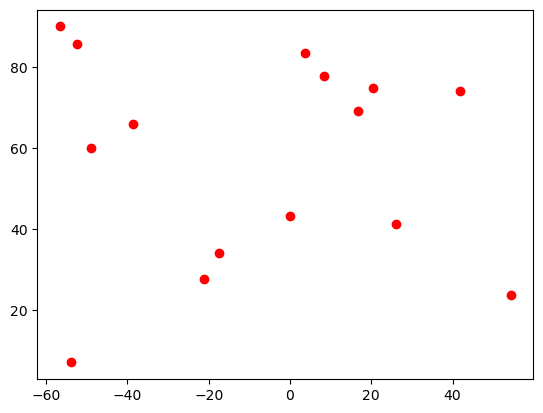

Run took 1875.500 sec
(120, 1, 2, 5112) 120 2556 2556
[  0  15  29  42  54  65  75  84  92  99 105 110 114 117 119]
(120, 1, 2, 5112) 120 2556 2556
[  0  15  29  42  54  65  75  84  92  99 105 110 114 117 119]
(120, 1, 2, 5112) 120 2556 2556
[  0  15  29  42  54  65  75  84  92  99 105 110 114 117 119]
peak memory: 2979.69 MiB, increment: 48.69 MiB
Run took 0.612 sec


In [318]:
# Make X (projection operator)
lst_ref = 1.
latitude = -30.7215 * np.pi / 180.
lmax = 70

ant_pos4 = {}
for i in range(15):
    ant_pos4[i] = (np.random.uniform(low=-60., high=60.), np.random.uniform(low=0., high=100.), 0.)

for ant in ant_pos4.keys():
    plt.plot(ant_pos4[ant][0], ant_pos4[ant][1], 'ro')
plt.show()

freqs4 = np.linspace(100e6, 110e6, 1)
lsts4 = np.linspace(0.01, 2., 2)
beams4 = [pyuvsim.AnalyticBeam('gaussian', diameter=14.) for ant in ant_pos4]

# Get raw projection operator
t0 = time.time()
vis_response4, _antpairs, _ell, _m = vis_proj_operator_lsts(freqs4, lsts4, beams4, ant_pos4, lmax=lmax, nside=128, latitude=latitude)
print("Run took %5.3f sec" % (time.time() - t0))

# Trim unwanted entries
t0 = time.time()
%memit Xarr4, antpairs4, ell4, m4 = trim_X_operator(vis_response4, _antpairs, _ell, _m)
print("Run took %5.3f sec" % (time.time() - t0))
X4 = Xarr4.reshape((-1, Xarr4.shape[-1]))

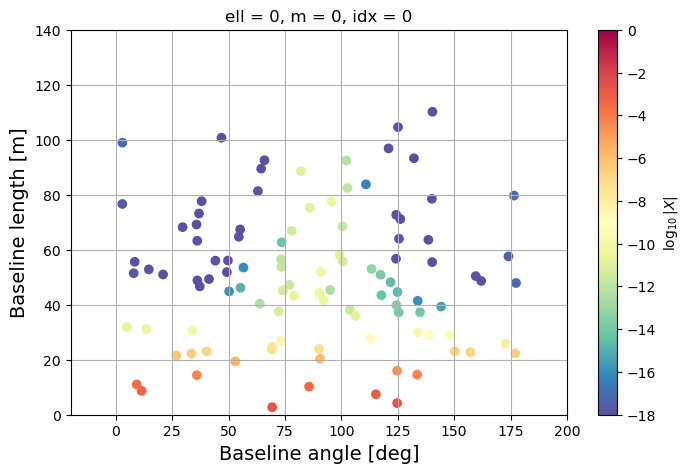

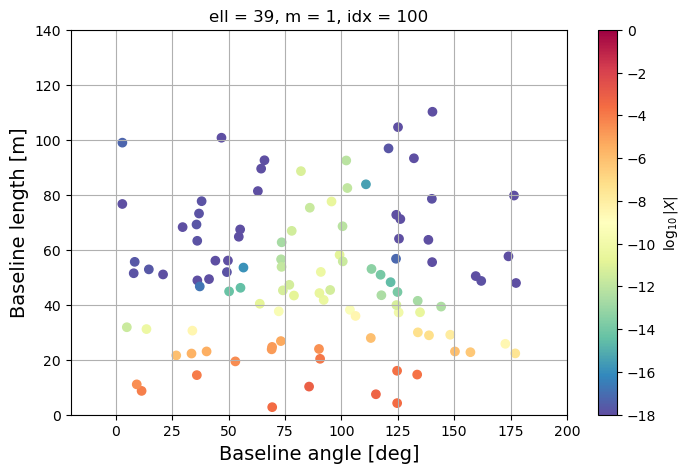

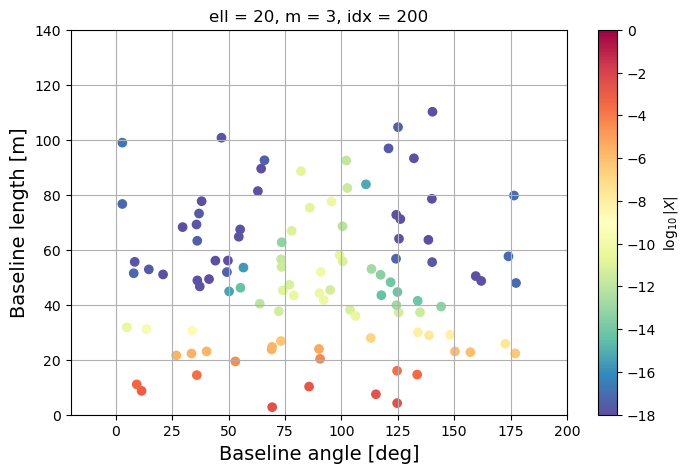

In [328]:
for idx in [0, 100, 200]: #np.arange(len(ell)):
    angs = []
    logmags = []
    bllens = []
    for i, bl in enumerate(antpairs4):
        x1, y1, z1 = ant_pos4[bl[0]]
        x2, y2, z2 = ant_pos4[bl[1]]
        bllen = np.sqrt((x1 - x2)**2. + (y1 - y2)**2.)
        ang = np.arccos((x2 - x1) / bllen) * 180. / np.pi
        logmag = np.log10(np.abs(Xarr4[i,0,1,idx].real))
        # Xarr Shape: (Nbls, Nfreqs, Nlsts, Nmodes)
        #print("%03d" % i, "%10s" % str(bl), "%7.1f" % logmag, "%7.2f m" % bllen, "%7.1f deg" % ang)

        bllens.append(bllen)
        angs.append(ang)
        logmags.append(logmag)

    plt.scatter(angs, bllens, c=logmags, cmap='Spectral_r', vmax=0., vmin=-18.)
    plt.title("ell = %d, m = %d, idx = %d" % (ell4[idx], m4[idx], idx))
    plt.colorbar(label="$\log_{10}|X|$")
    plt.xlim((-20., 200.))
    plt.ylim((0., 140.))
    plt.grid()
    
    plt.xlabel("Baseline angle [deg]", fontsize=14)
    plt.ylabel("Baseline length [m]", fontsize=14)
    plt.gcf().set_size_inches((8., 5.))
    plt.show()

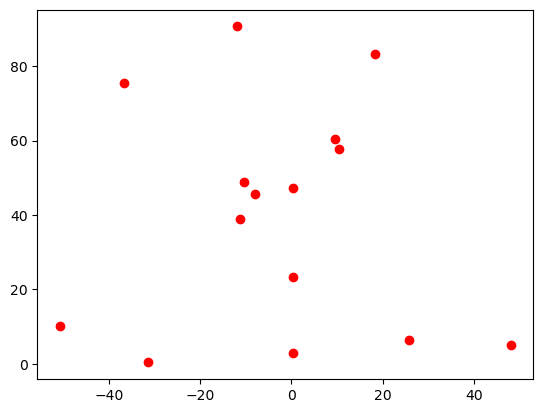

Run took 1478.003 sec
(120, 1, 2, 3906) 120 1953 1953
[  0  15  29  42  54  65  75  84  92  99 105 110 114 117 119]
(120, 1, 2, 3906) 120 1953 1953
[  0  15  29  42  54  65  75  84  92  99 105 110 114 117 119]
(120, 1, 2, 3906) 120 1953 1953
[  0  15  29  42  54  65  75  84  92  99 105 110 114 117 119]
peak memory: 2997.98 MiB, increment: 0.00 MiB
Run took 0.672 sec


In [323]:
# Make X (projection operator)
lst_ref = 1.
latitude = -30.7215 * np.pi / 180.
lmax = 61

ant_pos4 = {}
for i in range(15):
    ant_pos4[i] = (np.random.uniform(low=-60., high=60.), np.random.uniform(low=0., high=100.), 0.)

for ant in ant_pos4.keys():
    plt.plot(ant_pos4[ant][0], ant_pos4[ant][1], 'ro')
plt.show()

freqs4 = np.linspace(180e6, 190e6, 1)
lsts4 = np.linspace(0.01, 2., 2)
beams4 = [pyuvsim.AnalyticBeam('gaussian', diameter=14.) for ant in ant_pos4]

# Get raw projection operator
t0 = time.time()
vis_response4, _antpairs, _ell, _m = vis_proj_operator_lsts(freqs4, lsts4, beams4, ant_pos4, lmax=lmax, nside=128, latitude=latitude)
print("Run took %5.3f sec" % (time.time() - t0))

# Trim unwanted entries
t0 = time.time()
%memit Xarr4, antpairs4, ell4, m4 = trim_X_operator(vis_response4, _antpairs, _ell, _m)
print("Run took %5.3f sec" % (time.time() - t0))
X4 = Xarr4.reshape((-1, Xarr4.shape[-1]))

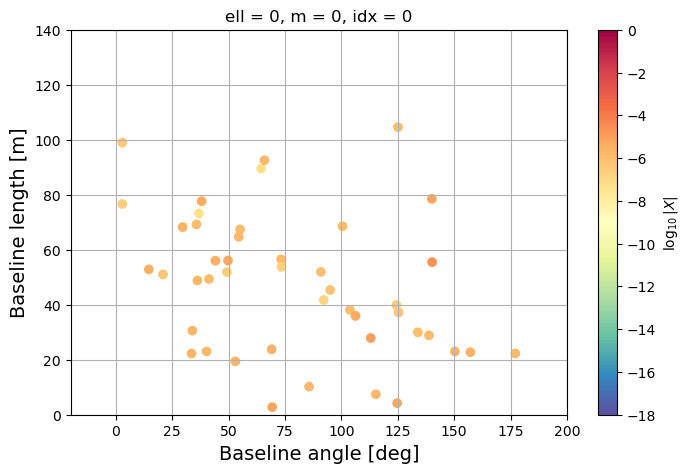

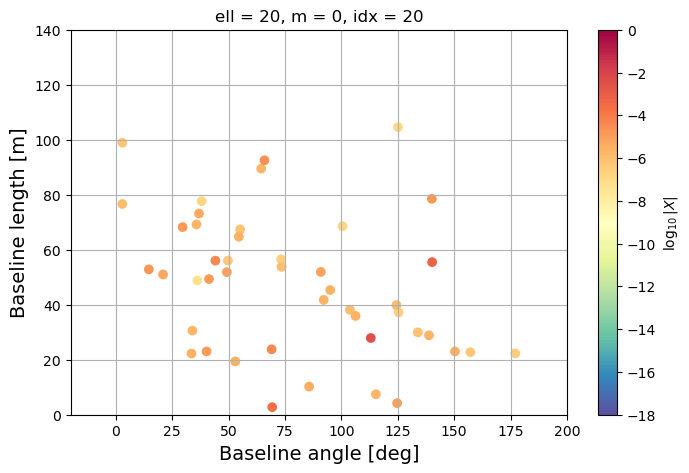

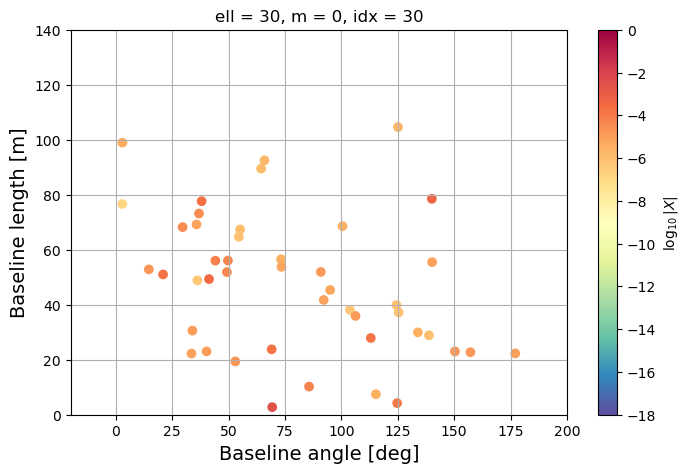

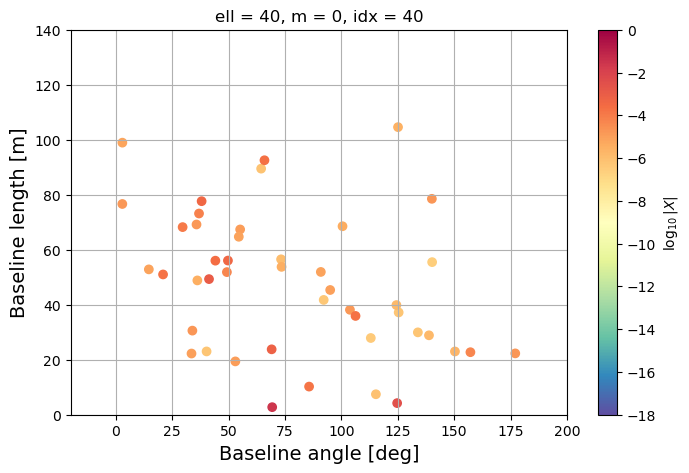

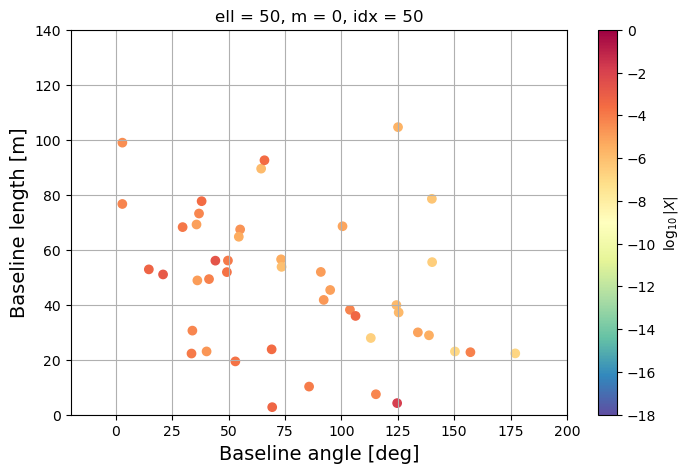

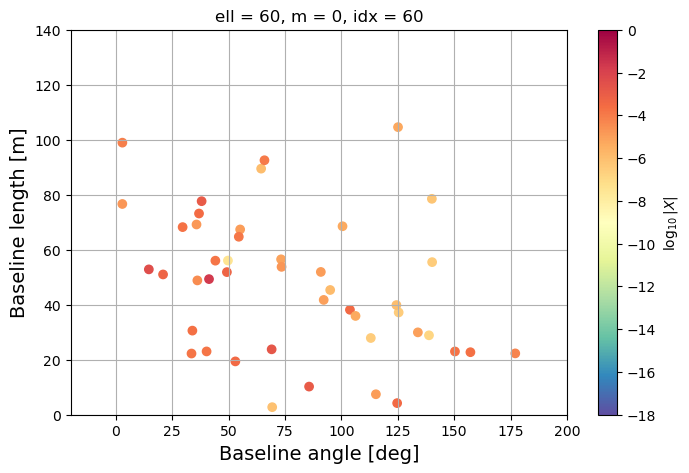

In [326]:
for idx in [0, 20, 30, 40, 50, 60]: #np.arange(len(ell)):
    angs = []
    logmags = []
    bllens = []
    for i, bl in enumerate(antpairs3):
        x1, y1, z1 = ant_pos4[bl[0]]
        x2, y2, z2 = ant_pos4[bl[1]]
        bllen = np.sqrt((x1 - x2)**2. + (y1 - y2)**2.)
        ang = np.arccos((x2 - x1) / bllen) * 180. / np.pi
        logmag = np.log10(np.abs(Xarr3[i,0,1,idx].real))
        # Xarr Shape: (Nbls, Nfreqs, Nlsts, Nmodes)
        #print("%03d" % i, "%10s" % str(bl), "%7.1f" % logmag, "%7.2f m" % bllen, "%7.1f deg" % ang)

        bllens.append(bllen)
        angs.append(ang)
        logmags.append(logmag)

    plt.scatter(angs, bllens, c=logmags, cmap='Spectral_r', vmax=0., vmin=-18.)
    plt.title("ell = %d, m = %d, idx = %d" % (ell4[idx], m4[idx], idx))
    plt.colorbar(label="$\log_{10}|X|$")
    plt.xlim((-20., 200.))
    plt.ylim((0., 140.))
    plt.grid()
    
    plt.xlabel("Baseline angle [deg]", fontsize=14)
    plt.ylabel("Baseline length [m]", fontsize=14)
    plt.gcf().set_size_inches((8., 5.))
    plt.show()

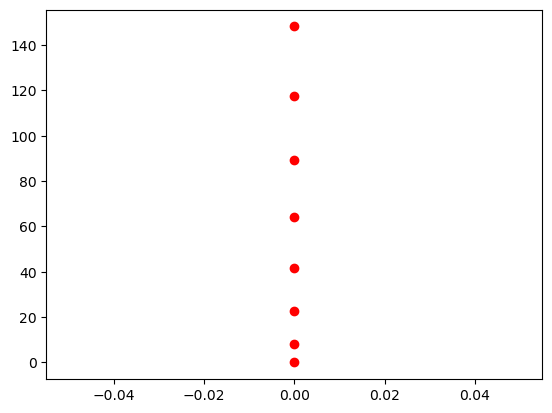

Running


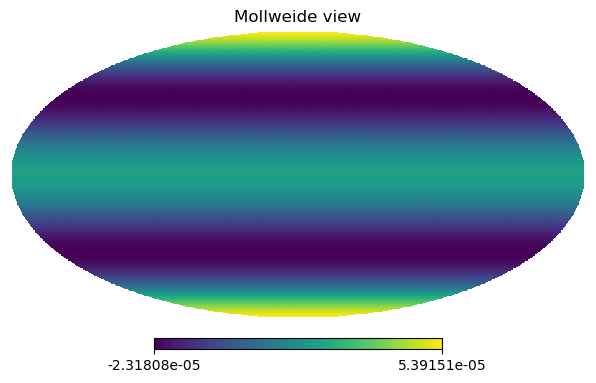

--------------------------------------------------------------------------------
ii = 0, jj = 0
    len =   0.000 m, angle =   nan deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 0 (0.0, 0.0, 0.0) (0.0, 0.0, 0.0)


/tmp/ipykernel_664579/129220903.py:134: RuntimeWarning: invalid value encountered in double_scalars
  ang = np.arccos((x2 - x1) / bllen) * 180. / np.pi


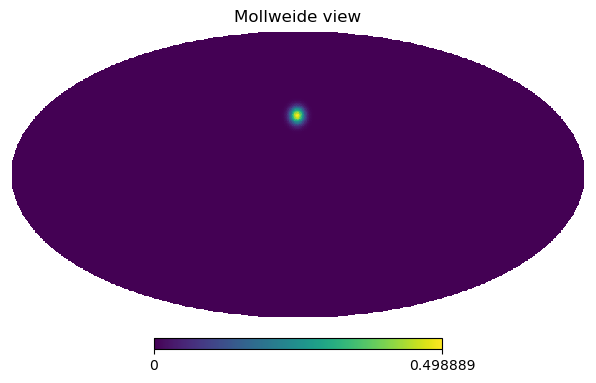

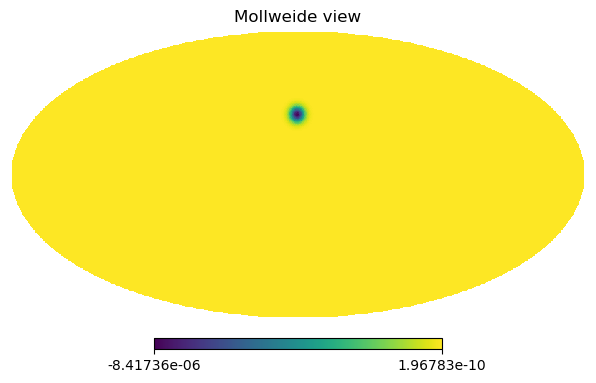

Total value: -0.002013448397346244
--------------------------------------------------------------------------------
ii = 0, jj = 1
    len =   8.000 m, angle = 90.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 1 (0.0, 0.0, 0.0) (0.0, 8.0, 0.0)


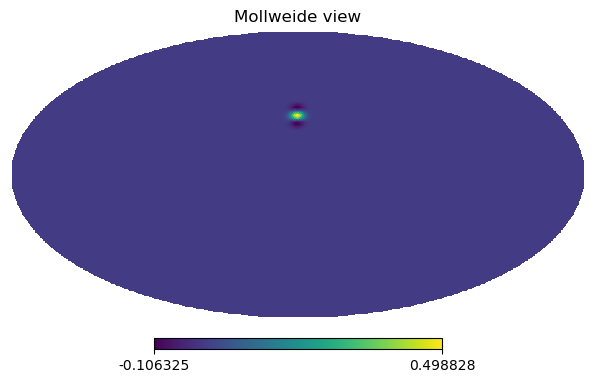

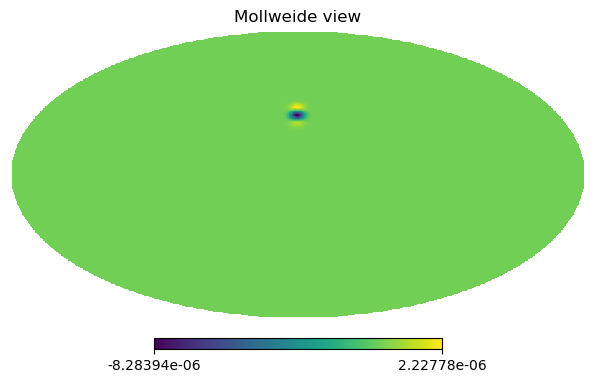

Total value: -0.000666857344558639
--------------------------------------------------------------------------------
ii = 0, jj = 2
    len =  22.627 m, angle = 90.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 2 (0.0, 0.0, 0.0) (0.0, 22.627416997969522, 0.0)


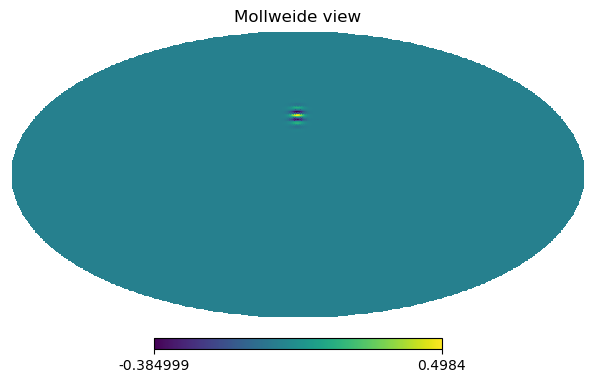

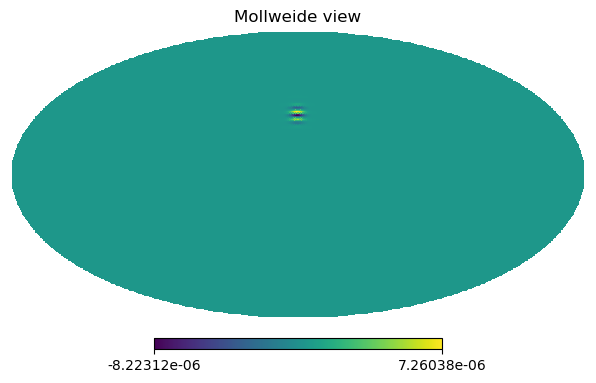

Total value: -2.4837100575604423e-07
--------------------------------------------------------------------------------
ii = 0, jj = 3
    len =  41.569 m, angle = 90.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 3 (0.0, 0.0, 0.0) (0.0, 41.569219381653056, 0.0)


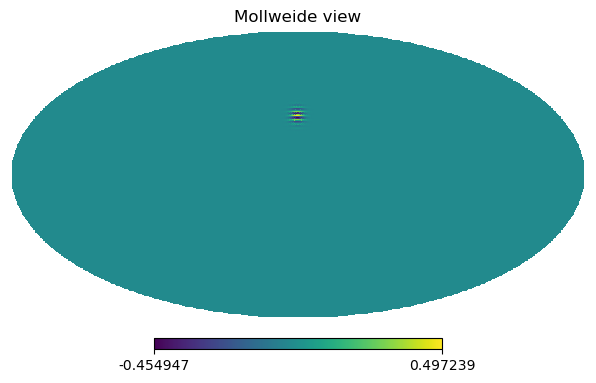

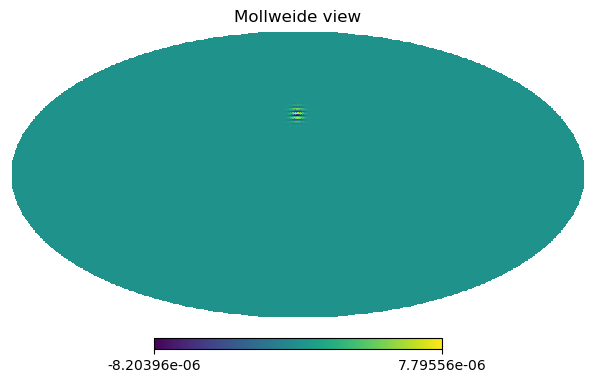

Total value: -3.4439531676258873e-11
--------------------------------------------------------------------------------
ii = 0, jj = 4
    len =  64.000 m, angle = 90.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 4 (0.0, 0.0, 0.0) (0.0, 64.0, 0.0)


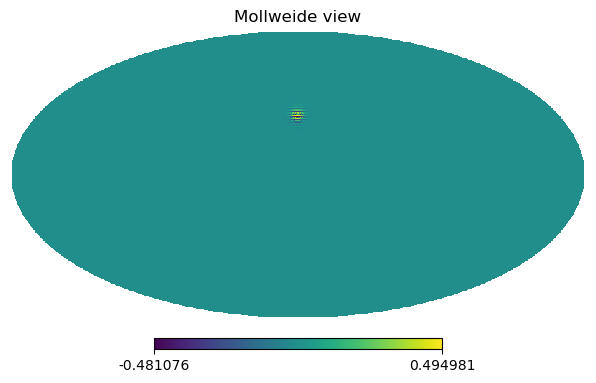

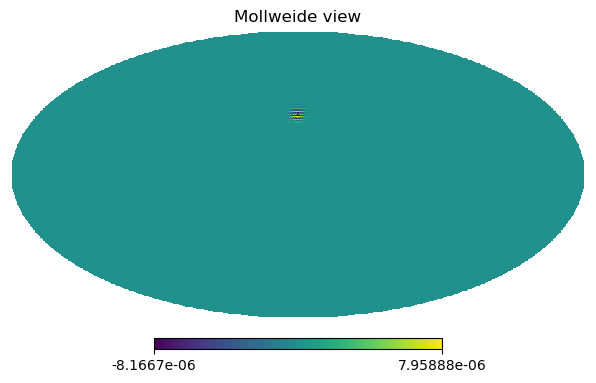

Total value: 7.229921563966186e-11
--------------------------------------------------------------------------------
ii = 0, jj = 5
    len =  89.443 m, angle = 90.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 5 (0.0, 0.0, 0.0) (0.0, 89.44271909999159, 0.0)


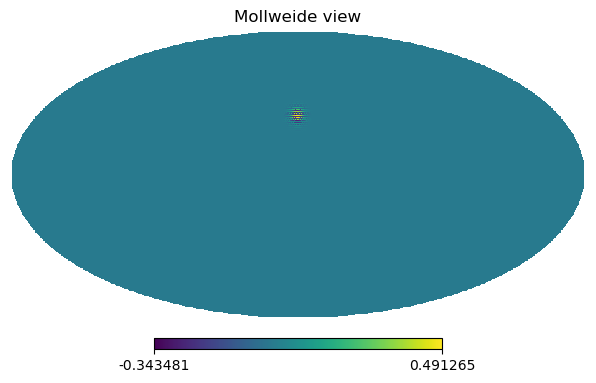

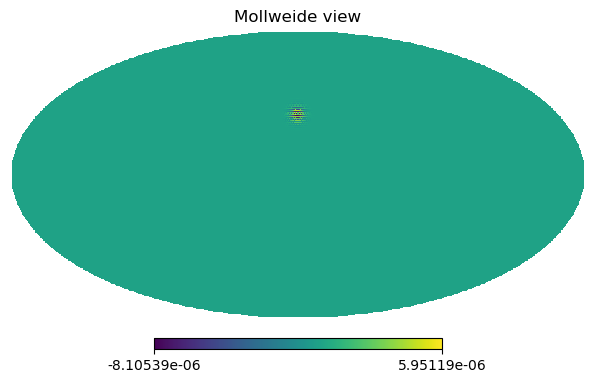

Total value: 8.296696283993257e-11
--------------------------------------------------------------------------------
ii = 0, jj = 6
    len = 117.576 m, angle = 90.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 6 (0.0, 0.0, 0.0) (0.0, 117.57550765359255, 0.0)


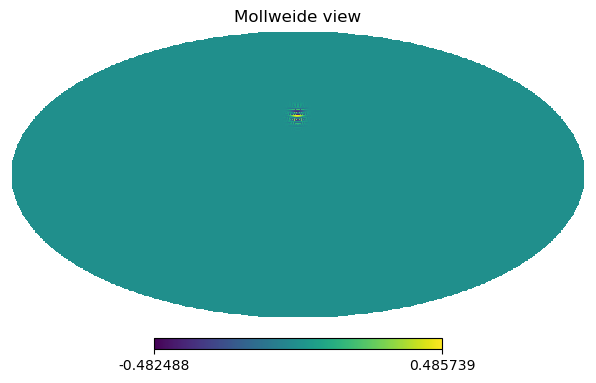

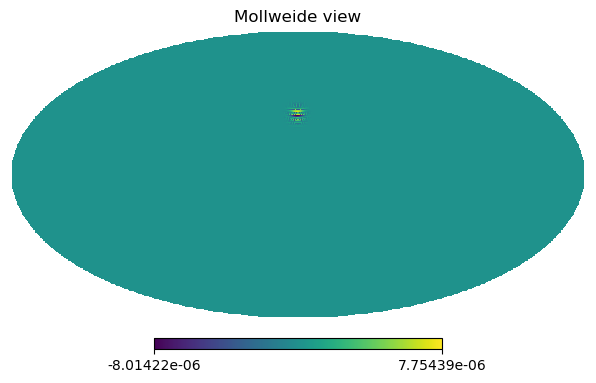

Total value: 5.726683614494902e-11
--------------------------------------------------------------------------------
ii = 0, jj = 7
    len = 148.162 m, angle = 90.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 7 (0.0, 0.0, 0.0) (0.0, 148.1620734196171, 0.0)


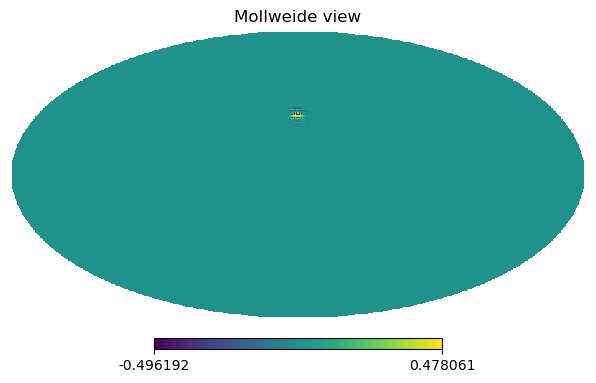

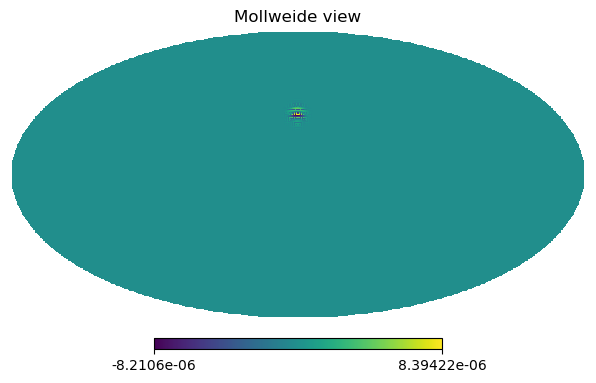

Total value: 1.4498822076190267e-11


KeyError: 8

In [352]:
def simulate_vis_per_alm(
    lmax,
    nside,
    ants,
    freqs,
    lsts,
    beams,
    polarized=False,
    precision=2,
    latitude=-30.7215 * np.pi / 180.0,
    use_feed="x",
    multiprocess=True,
    amplitude=1.
):
    """
    Run a basic simulation, returning the visibility for each spherical harmonic mode
    separately. Based on ``vis_cpu``.
    This wrapper handles the necessary coordinate conversions etc.
    NOTE: The spherical harmonic modes are defined in the equatorial (RA, Dec)
    coordinate system.
    Parameters:
        lmax (int):
            Maximum ell value to simulate.
        nside (int):
            Healpix map nside used to generate the simulations. Higher values
            will give more accurate results.
        ants (dict):
            Dictionary of antenna positions. The keys are the antenna names
            (integers) and the values are the Cartesian x,y,z positions of the
            antennas (in meters) relative to the array center.
        freqs (array_like):
            Frequency channels for the simulation, in Hz.
        lsts (array_like):
            Local sidereal times for the simulation, in radians. Range is
            [0, 2 pi].
        beams (list of ``UVBeam`` objects):
            Beam objects to use for each antenna.
        polarized (bool):
            If True, use polarized beams and calculate all available linearly-
            polarized visibilities, e.g. V_nn, V_ne, V_en, V_ee.
            Default: False (only uses the 'ee' polarization).
        precision (int):
            Which precision setting to use for :func:`~vis_cpu`. If set to
            ``1``, uses the (``np.float32``, ``np.complex64``) dtypes. If set
            to ``2``, uses the (``np.float64``, ``np.complex128``) dtypes.
        latitude (float):
            The latitude of the center of the array, in radians. The default is
            the HERA latitude = -30.7215 * pi / 180.
        multiprocess (bool): Whether to use multiprocessing to speed up the
            calculation.
        amplitude (float):
            The amplitude to use for the spherical harmonic modes when running
            the simulation.
    Returns:
        ell, m (array_like):
            Arrays of integer values of ell, m modes, with the same ordering as
            the modes in the last dimensions of `vis`. This uses the default
            healpy ordering and convention (+ve m modes only).
        vis (array_like):
            Complex, shape (NAXES, NFEED, NFREQS, NTIMES, NANTS, NANTS, NMODES)
            if ``polarized == True``, or (NFREQS, NTIMES, NANTS, NANTS, NMODES)
            otherwise. This is the visibility response of the interferometer
            to each spherical harmonic (ell, m) mode.
            The final dimension has size `NMODES == 2*ell.size`. The first half
            of this dimensions (i.e. of length `ell.size`) corresponds to real
            spherical harmonic coefficients, with the same ordering as the `ell`
            and `m` arrays. The second set is for imaginary SH coefficients, again
            with the same ordering.
    """
    print("Running")
    # Make sure these are array_like
    freqs = np.atleast_1d(freqs)
    lsts = np.atleast_1d(lsts)

    # Array of ell, m values in healpy ordering
    ell, m = hp.Alm().getlm(lmax=lmax)

    # Get Healpix pixel coords
    npix = hp.nside2npix(nside)
    pix_area = 4.*np.pi / npix # steradians per pixel
    dec, ra = hp.pix2ang(nside=nside, ipix=np.arange(npix), lonlat=False)
    # RA must be in range [0, 2 pi] and Dec in range [-pi, +pi]
    dec = dec - 0.5*np.pi # shift Dec coords

    # Dummy fluxes (one everywhere)
    fluxes = np.ones((npix, freqs.size))

    # Run simulation using the per-source simulation function, to get
    # visibility contrib. from each pixel
    vis_pix = hydra.vis_simulator.simulate_vis_per_source(ants=ants,
                                      fluxes=fluxes,
                                      ra=ra,
                                      dec=dec,
                                      freqs=freqs,
                                      lsts=lsts,
                                      beams=beams,
                                      polarized=polarized,
                                      precision=precision,
                                      latitude=latitude,
                                      use_feed=use_feed,
                                      multiprocess=multiprocess)

    # Empty array with the right shape (no. visibilities times no. l,m modes)
    shape = list(vis_pix.shape)
    shape[-1] = 2*ell.size # replace last dim. with Nmodes (real + imag.)
    vis = np.zeros(shape, dtype=np.complex128)

    # Loop over (ell, m) modes, weighting the precomputed visibility sim
    # by the value of each spherical harmonic mode in each pixel
    alm = np.zeros(ell.size, dtype=np.complex128)
    for n in [4]:

        # Start with zero vector for all modes
        alm *= 0

        # Loop over real, imaginary values for this mode only
        for j, val in enumerate([1., 1.j]):

            # Make healpix map for this mode only
            alm[n] = val
            skymap = hp.alm2map(alm, nside=nside) * pix_area * amplitude
            
            #################
            hp.mollview(skymap)
            plt.gcf().set_size_inches((6., 4.))
            plt.show()
            
            ii = 0
            for jj in range(15):
                
                x1, y1, z1 = ants[ii]
                x2, y2, z2 = ants[jj]
                bllen = np.sqrt((x1 - x2)**2. + (y1 - y2)**2.)
                ang = np.arccos((x2 - x1) / bllen) * 180. / np.pi
                
                print("-"*80)
                print("ii = %d, jj = %d" % (ii, jj))
                print("    len = %7.3f m, angle = %5.2f deg" % (bllen, ang))
                print("-"*80)
                
                print(vis_pix.shape)
                print(ii, jj, ants[ii], ants[jj])

                hp.mollview(vis_pix[0,0,  ii,jj,:].real)
                plt.gcf().set_size_inches((6., 4.))
                plt.show()


                hp.mollview(vis_pix[0,0,  ii,jj,:].real * skymap)
                plt.gcf().set_size_inches((6., 4.))
                plt.show()

                print("Total value:", np.sum(vis_pix[0,0,  ii,jj,:].real * skymap))
            #################
            
            
            # multiply by pixel area to get 'integrated' quantity
            # (results will be in Jy units)

            # Multiply visibility for each pixel by the pixel value for this mode
            if polarized:
                # vis_pix: (NAXES, NFEED, NFREQS, NTIMES, NANTS, NANTS, NSRCS)
                vis[:,:,:,:,:,:,n + j*ell.size] = np.sum(vis_pix * skymap, axis=-1)
                # Last dim. of vis is in blocks of real (first ell.size modes) and
                # imaginary (last ell.size modes)
            else:
                # vis_pix: (NFREQS, NTIMES, NANTS, NANTS, NSRCS)
                vis[:,:,:,:,n + j*ell.size] = np.sum(vis_pix * skymap, axis=-1)
            
            raise

    return ell, m, vis


# Make X (projection operator)
latitude = -30.7215 * np.pi / 180.
lmax = 5

ant_pos = {}
for i in range(8):
    ant_pos[i] = (0., i**1.5 * 8., 0.)

for ant in ant_pos.keys():
    plt.plot(ant_pos[ant][0], ant_pos[ant][1], 'ro')
plt.show()

freqs = np.linspace(180e6, 190e6, 1)
lsts = np.linspace(0.01, 2., 2)
beams = [pyuvsim.AnalyticBeam('gaussian', diameter=14.) for ant in ant_pos]


simulate_vis_per_alm(
    lmax=lmax,
    nside=128,
    ants=ant_pos,
    freqs=freqs,
    lsts=lsts,
    beams=beams,
    polarized=False,
    precision=2,
    latitude=-30.7215 * np.pi / 180.0,
    use_feed="x",
    multiprocess=True,
    amplitude=1.
)

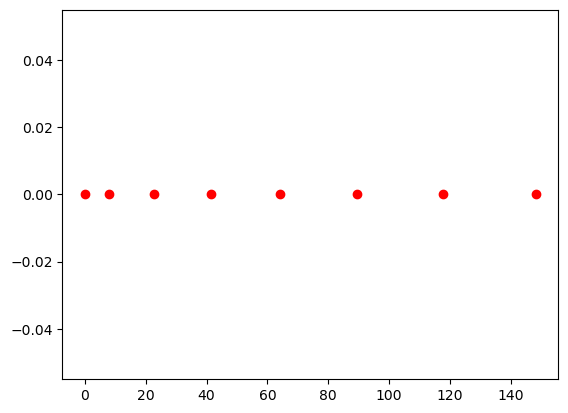

Running


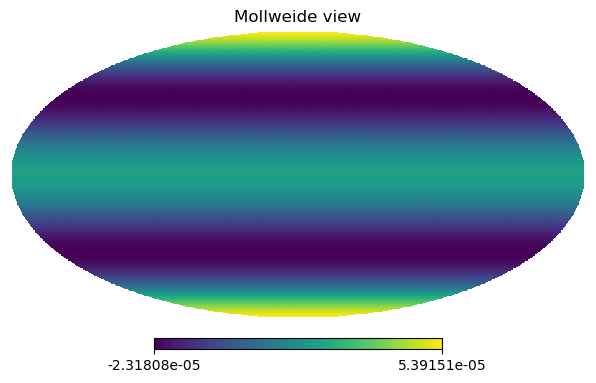

--------------------------------------------------------------------------------
ii = 0, jj = 0
    len =   0.000 m, angle =   nan deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 0 (0.0, 0.0, 0.0) (0.0, 0.0, 0.0)


/tmp/ipykernel_664579/129220903.py:134: RuntimeWarning: invalid value encountered in double_scalars
  ang = np.arccos((x2 - x1) / bllen) * 180. / np.pi


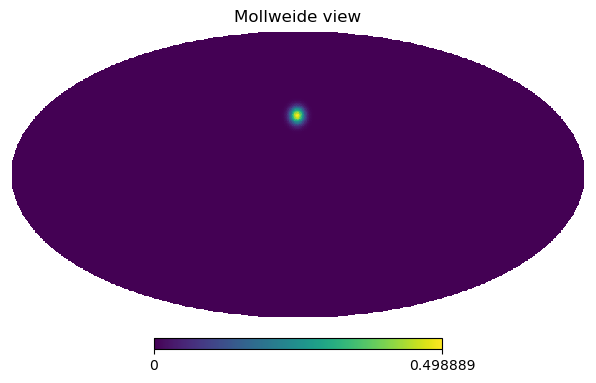

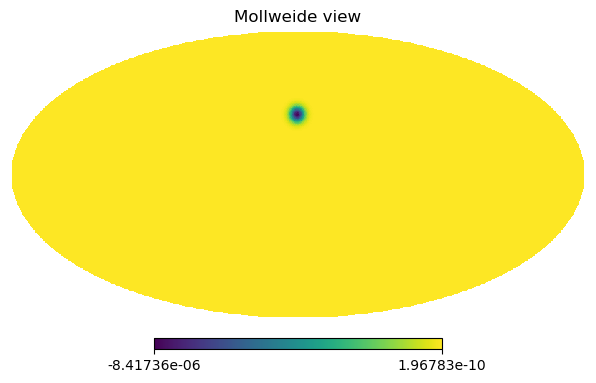

Total value: -0.002013448397346244
--------------------------------------------------------------------------------
ii = 0, jj = 1
    len =   8.000 m, angle =  0.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 1 (0.0, 0.0, 0.0) (8.0, 0.0, 0.0)


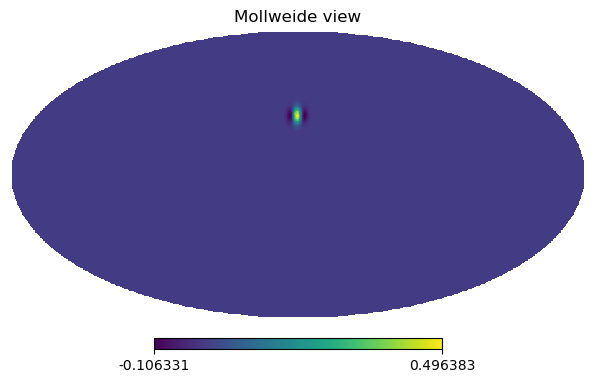

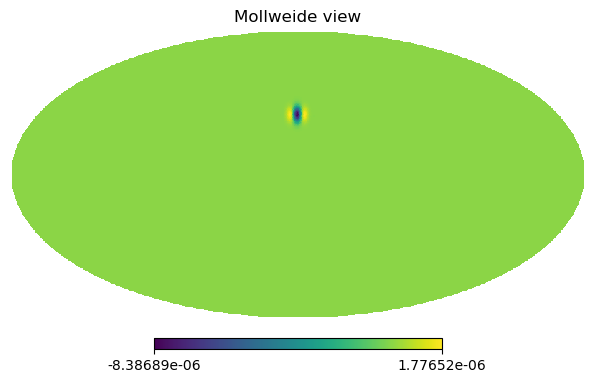

Total value: -0.0006385667014903331
--------------------------------------------------------------------------------
ii = 0, jj = 2
    len =  22.627 m, angle =  0.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 2 (0.0, 0.0, 0.0) (22.627416997969522, 0.0, 0.0)


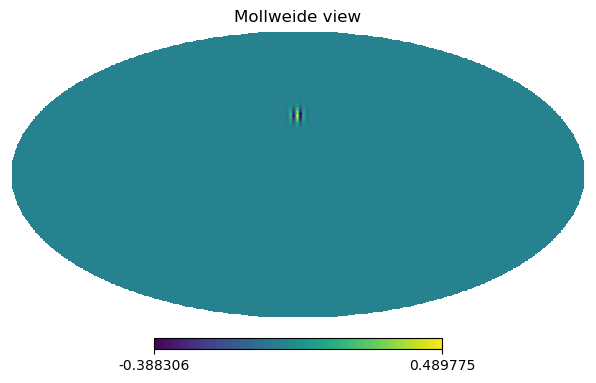

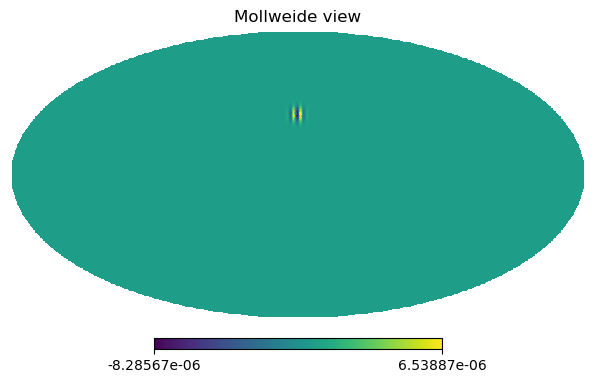

Total value: -1.8069703566569626e-07
--------------------------------------------------------------------------------
ii = 0, jj = 3
    len =  41.569 m, angle =  0.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 3 (0.0, 0.0, 0.0) (41.569219381653056, 0.0, 0.0)


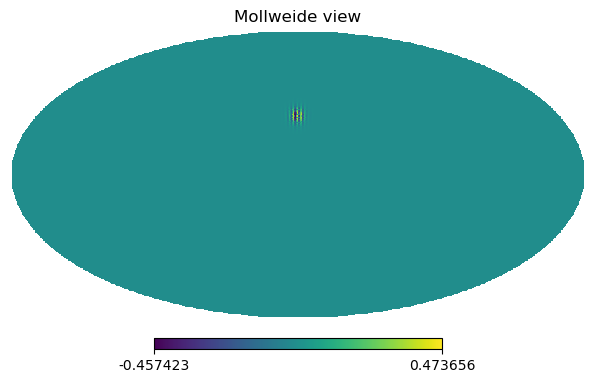

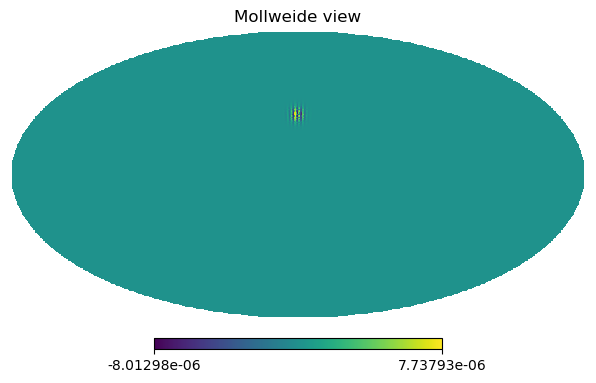

Total value: -1.8766061246352386e-17
--------------------------------------------------------------------------------
ii = 0, jj = 4
    len =  64.000 m, angle =  0.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 4 (0.0, 0.0, 0.0) (64.0, 0.0, 0.0)


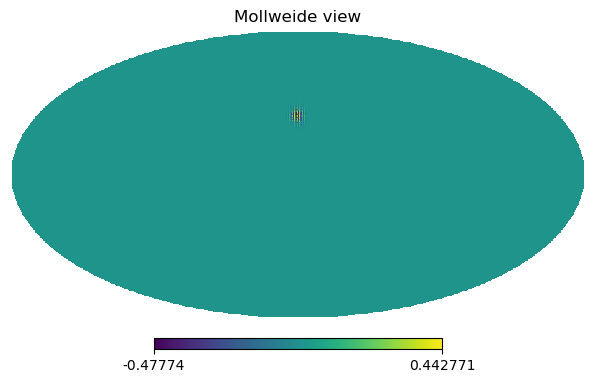

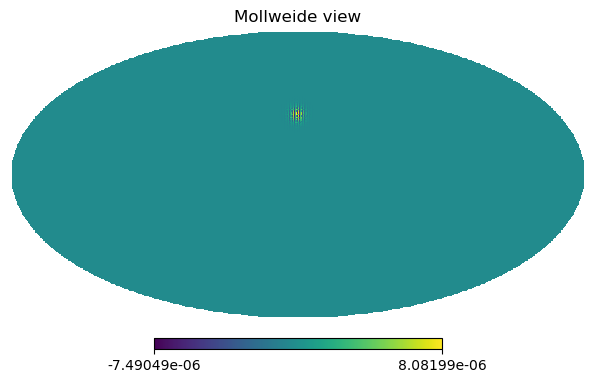

Total value: -3.0881322503806834e-19
--------------------------------------------------------------------------------
ii = 0, jj = 5
    len =  89.443 m, angle =  0.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 5 (0.0, 0.0, 0.0) (89.44271909999159, 0.0, 0.0)


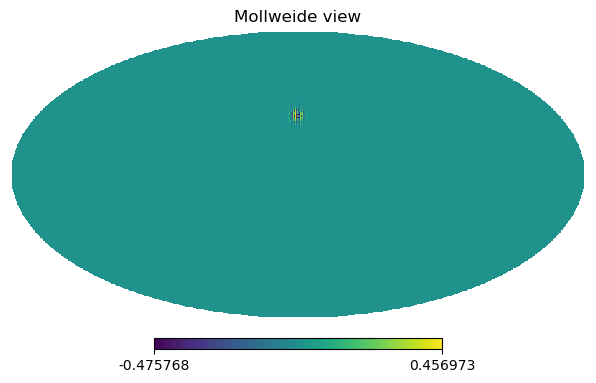

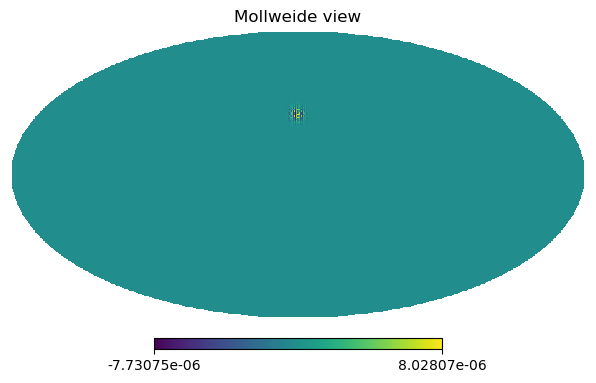

Total value: 2.9337977947624705e-17
--------------------------------------------------------------------------------
ii = 0, jj = 6
    len = 117.576 m, angle =  0.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 6 (0.0, 0.0, 0.0) (117.57550765359255, 0.0, 0.0)


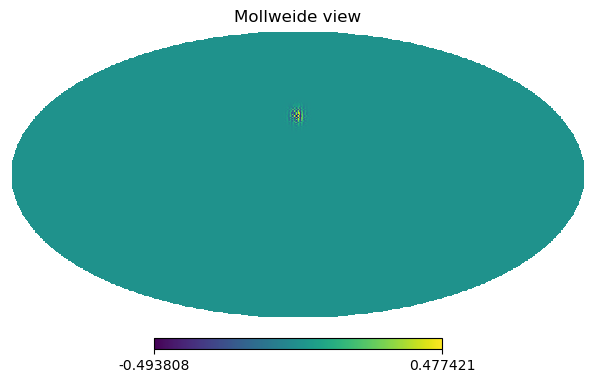

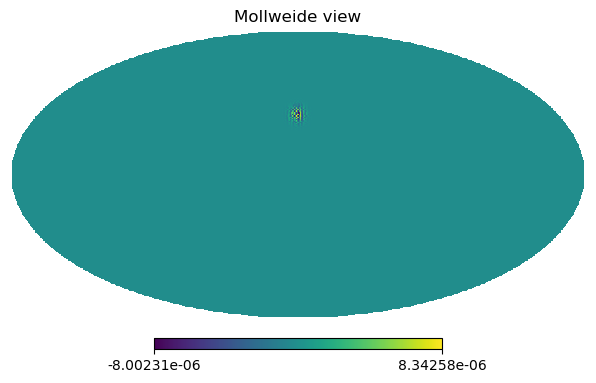

Total value: -4.170102483686318e-18
--------------------------------------------------------------------------------
ii = 0, jj = 7
    len = 148.162 m, angle =  0.00 deg
--------------------------------------------------------------------------------
(1, 2, 8, 8, 196608)
0 7 (0.0, 0.0, 0.0) (148.1620734196171, 0.0, 0.0)


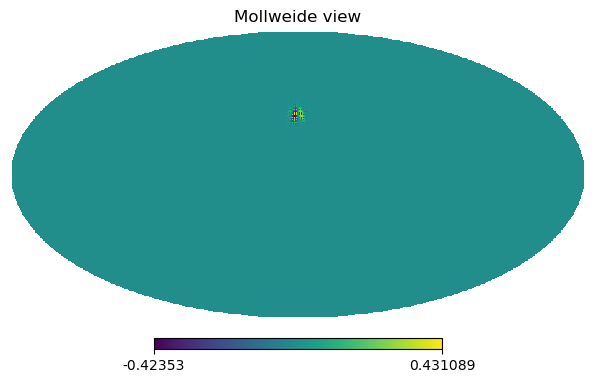

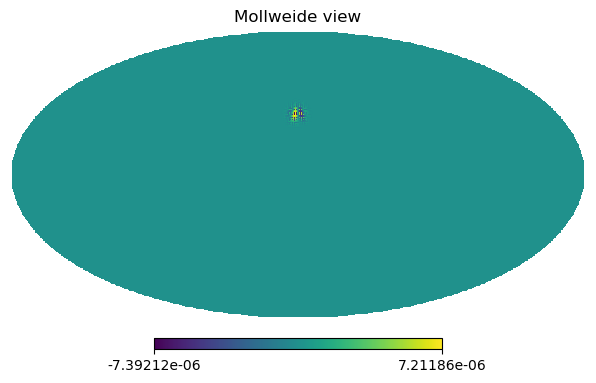

Total value: 1.590800922587612e-14


KeyError: 8

In [353]:
# Make X (projection operator)
latitude = -30.7215 * np.pi / 180.
lmax = 5

ant_pos = {}
for i in range(8):
    ant_pos[i] = (i**1.5 * 8., 0., 0.)

for ant in ant_pos.keys():
    plt.plot(ant_pos[ant][0], ant_pos[ant][1], 'ro')
plt.show()

freqs = np.linspace(180e6, 190e6, 1)
lsts = np.linspace(0.01, 2., 2)
beams = [pyuvsim.AnalyticBeam('gaussian', diameter=14.) for ant in ant_pos]


simulate_vis_per_alm(
    lmax=lmax,
    nside=128,
    ants=ant_pos,
    freqs=freqs,
    lsts=lsts,
    beams=beams,
    polarized=False,
    precision=2,
    latitude=-30.7215 * np.pi / 180.0,
    use_feed="x",
    multiprocess=True,
    amplitude=1.
)